# 3. Hydro: Sub-Regions — One Galaxy, One Mass Budget

In this tutorial we dissect one simulated disc galaxy into structural
components and assemble a gas **mass budget** whose entries genuinely add up.
That sounds like bookkeeping, but on an adaptive mesh it is a measurement
problem: every smooth boundary you draw (a sphere, a cylinder, a shell) slices
straight through AMR cells, and *what you do with those sliced cells decides
your number*.

There are three possible answers, and Mera implements all of them:

1. **Keep every intersecting cell whole** — an *upper bound* on mass and volume
   (the region grows a jagged, outward-bulging rim of over-counted cells).
2. **Keep only cells whose centre is inside** — the rim is now jagged inward;
   straddling material is thrown away.
3. **Split the boundary cells** — each straddling cell carries a `:fraction`
   column giving the volume fraction that lies inside the region. Mass, volume,
   and projections then honour that fraction. This is the *measurement*; the
   other two show how much is at stake at the boundary.

The plan of the page: meet the galaxy and mark every cut we intend to make
(§1), make one cut end to end (§2), calibrate the three boundary treatments on
a single sphere (§3), then cut the galaxy into components (§4), learn to
compose regions algebraically (§5), and close the books — a budget that
balances to floating-point accuracy (§6). Then the deeper material: how sharp
the rendered boundaries really are, `refine`, and an honest cosmetic clip
(§7); regions tilted off the grid axes, including shells and an in-plane bar
(§8); a gallery of composite regions with a scientific purpose — chimneys, a
crescent, Swiss cheese seeded from star clusters, bows, a filament tube (§9);
the same region objects cutting *star particles*, so the budget gains a
stellar column (§10); and the working-set pattern for snapshots too large to
load whole (§11). A reference to the classic API (§12) and practical guidance
(§13) round the page off.

!!! warning "range_unit = :standard means box fractions"
    All spatial selection functions accept `range_unit=:standard`, in which
    coordinates and radii are **fractions of the box length** (0…1), *not*
    physical lengths. Forgetting this is the classic way to select an empty or
    absurdly large region. This tutorial uses `range_unit=:kpc` with explicit
    centres throughout.

**What tool for what job?**

| Goal | Tool |
|:--|:--|
| Carve a geometric shape, measured with split boundary cells | `Sphere`, `Cuboid`, `Cylinder` + `subregion` |
| Shells (rings, envelopes) | `SphericalShell`, `CylindricalShell` |
| Combine shapes | `∩`, `∪`, `\`, `!` (region algebra) |
| Quick whole-cell cuts, older scripts | classic `subregion(gas, :cuboid; ...)`, `shellregion` |
| Select by *value* (density, temperature, …) | [Masking & Filtering](05_multi_Masking_Filtering.md) |

This page covers the geometric tools; the value-space tools compose with them.

## 1. The Galaxy and the Dissection Plan

We load a single snapshot of a simulated disc galaxy in a 48 kpc box and read
only the density field (`:rho`) up to level 12 — everything in this tutorial
(surface density, mass, volume, cell size, `:fraction`) derives from it.
The box centre `[:bc]` sits at (24, 24, 24) kpc.

In [1]:
# Example-data root. Point this at your own simulation folder, or set the
# MERA_EXAMPLES environment variable; every path below is built from it.
MERA_EXAMPLES = get(ENV, "MERA_EXAMPLES", "/Volumes/FASTStorage/Simulations/Mera-Tests");

using Mera, CairoMakie
# Makie also exports geometric names (Sphere, Cylinder, ...) — state explicitly
# that we mean Mera's region types:
import Mera: Sphere, Cuboid, Cylinder, SphericalShell, CylindricalShell
CairoMakie.activate!()

info = getinfo(400, "$MERA_EXAMPLES/RAMSES/manu_sim_sf_L14", verbose=false)
gas  = gethydro(info, :rho, lmax=12, smallr=1e-11, verbose=false, show_progress=false);

kpc = info.scale.kpc   # code length -> kpc
println("cells loaded : ", length(gas.data))
println("box size     : ", round(gas.boxlen * kpc, sigdigits=4), " kpc, centre [:bc] at (24, 24, 24) kpc")


*__   __ _______ ______   _______ 


|  |_|  |       |    _ | |   _   |
|       |    ___|   | || |  |_|  |
|       |   |___|   |_||_|       |
|       |    ___|    __  |       |
| ||_|| |   |___|   |  | |   _   |
|_|   |_|_______|___|  |_|__| |__|
Mera v1.8.0



cells loaded : 18966620


box size     : 48.0 kpc, centre [:bc] at (24, 24, 24) kpc


One plotting helper serves the whole notebook, and it enforces the two rules
that make boundary comparisons fair: **every panel shares one fixed surface-density
colour scale** (so identical gas renders identically everywhere on this page,
and any two panels may be compared directly), and **every figure carries one
labelled colorbar** for that shared scale. `show_sd!` draws a log-scaled
surface-density panel in kpc relative to the projection centre; `sd_bar!` adds
the colorbar; `proj` wraps `projection` with the settings we reuse everywhere
(note `pxsize=[0.25, :kpc]` — pixel size in physical units).

One reading convention for the whole page: inside each code cell, a comment
banner — `# ── figure code from here …` — marks where the Mera concepts end
and pure plot furniture (panels, overlays, colorbars) begins. **Read above
the banner; skim below it.**

In [2]:
# ─────────────────────────────────────────────────────────────────────
# FIGURE INFRASTRUCTURE for the whole page — skim freely on first read.
# The one Mera-relevant definition is `proj` at the bottom: the projection
# defaults every panel reuses (direction, centre, pxsize in physical units).
# ─────────────────────────────────────────────────────────────────────
const SDLIM = (-3.0, 3.0)   # log10 Σ [Msol/pc²] — one colour scale for every map on this page

function show_sd!(ax, p; flo=1e-3, decorate=false)
    xs = range(p.cextent[1]*kpc, p.cextent[2]*kpc; length=size(p.maps[:sd], 1))
    ys = range(p.cextent[3]*kpc, p.cextent[4]*kpc; length=size(p.maps[:sd], 2))
    heatmap!(ax, xs, ys, log10.(max.(p.maps[:sd], flo)); colormap=:inferno, colorrange=SDLIM)
    ax.aspect = DataAspect()
    ax.backgroundcolor = :black
    decorate || hidedecorations!(ax)
    return ax
end

# same, but with FIXED axis limits (kpc, relative to the projection centre) so
# side-by-side panels compare fairly even when their data extents differ
function show_sd!(ax, p, lims; kwargs...)
    show_sd!(ax, p; kwargs...)
    limits!(ax, lims...)
    return ax
end

sd_bar!(pos) = Colorbar(pos; colormap=:inferno, colorrange=SDLIM,
                        label="log₁₀ Σ  [Msol pc⁻²]")

function scalebar!(ax, x0, y0, len)   # a white physical-length bar for tick-less panels
    lines!(ax, [x0, x0 + len], [y0, y0]; color=:white, linewidth=3)
    text!(ax, x0 + len/2, y0 + 0.4; text="$(round(Int, len)) kpc", color=:white,
          fontsize=11, align=(:center, :bottom))
end

proj(data; kwargs...) = projection(data, :sd, :Msol_pc2;
                                   direction=:z, center=[:bc], range_unit=:kpc,   # ranges in kpc
                                   pxsize=[0.25, :kpc],
                                   verbose=false, show_progress=false, kwargs...)

proj (generic function with 1 method)

A habit worth copying before any cutting starts: *draw the plan on the data*.
The figure below is the map legend for the whole page. Face-on it marks every
component of the coming budget — the **nucleus zone** (r < 4 kpc), the
**inner zone** (4–6 kpc), the **star-forming ring** (6–10 kpc), and the
**rim** (10–12 kpc), all within the ±2 kpc disc slab — plus, in orange, the
off-centre **calibration sphere** on which §3 will compare the three boundary
treatments (deliberately off-centre: its surface sweeps from the refined disc
into coarse cells near the box edge). Edge-on it shows the disc slab and the
10–20 kpc spherical **envelope** we will measure *outside* the budget. This is
the only figure with coordinate ticks; every later panel states its frame in
the title and shares the colour scale defined above.

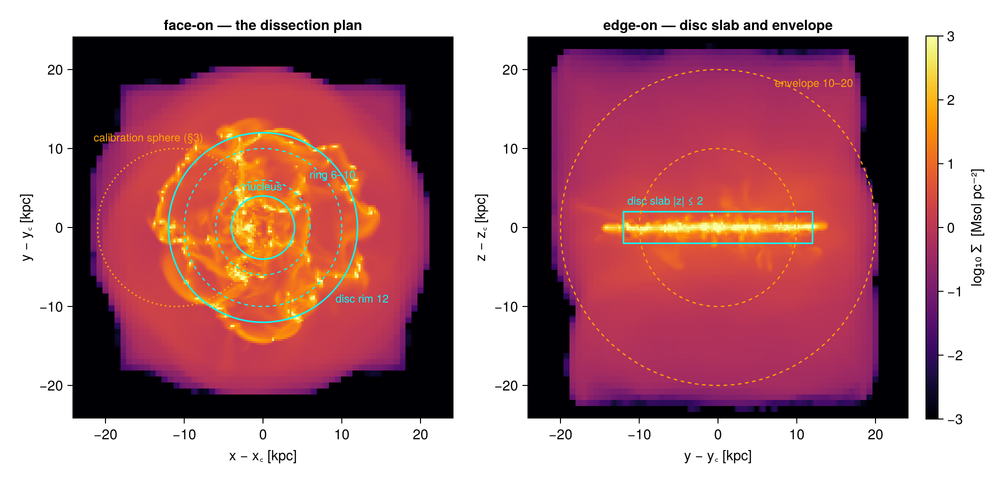

In [3]:
p_face = proj(gas)                 # full box, face-on (z)
p_edge = proj(gas; direction=:x)   # full box, edge-on


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(1000, 480))
axf = Axis(fig[1, 1], title="face-on — the dissection plan",
           xlabel="x − x꜀ [kpc]", ylabel="y − y꜀ [kpc]")
show_sd!(axf, p_face; decorate=true)
arc!(axf, Point2f(0, 0),  4., 0, 2π; color=:cyan, linewidth=1.5)
arc!(axf, Point2f(0, 0),  6., 0, 2π; color=:cyan, linewidth=1.2, linestyle=:dash)
arc!(axf, Point2f(0, 0), 10., 0, 2π; color=:cyan, linewidth=1.2, linestyle=:dash)
arc!(axf, Point2f(0, 0), 12., 0, 2π; color=:cyan, linewidth=1.5)
text!(axf,  0.0,  4.4; text="nucleus", color=:cyan, fontsize=11, align=(:center, :bottom))
text!(axf,  5.9,  5.9; text="ring 6–10", color=:cyan, fontsize=11)
text!(axf,  9.2, -9.8; text="disc rim 12", color=:cyan, fontsize=11)
arc!(axf, Point2f(-11, 0), 10., 0, 2π; color=:orange, linewidth=1.5, linestyle=:dot)
text!(axf, -21.5, 10.6; text="calibration sphere (§3)", color=:orange, fontsize=11)

axe = Axis(fig[1, 2], title="edge-on — disc slab and envelope",
           xlabel="y − y꜀ [kpc]", ylabel="z − z꜀ [kpc]")
show_sd!(axe, p_edge; decorate=true)
lines!(axe, [-12., 12., 12., -12., -12.], [-2., -2., 2., 2., -2.]; color=:cyan, linewidth=1.5)
text!(axe, -11.5, 2.6; text="disc slab |z| ≤ 2", color=:cyan, fontsize=11)
arc!(axe, Point2f(0, 0), 10., 0, 2π; color=:orange, linewidth=1.2, linestyle=:dash)
arc!(axe, Point2f(0, 0), 20., 0, 2π; color=:orange, linewidth=1.2, linestyle=:dash)
text!(axe, 7.2, 17.5; text="envelope 10–20", color=:orange, fontsize=11)

sd_bar!(fig[1, 3])
fig

## 2. Hello, Sub-Region

One cut, end to end, before any subtlety. A value-type region is an ordinary
Julia value — here `Sphere(10.)`, a sphere of radius 10 kpc. Its constructor
defaults do the right thing for this common case: `center=[:bc]` (the box
centre) and `range_unit=:kpc`. Applying it with `subregion` returns a new
object of the **same type as `gas`** (a `HydroDataType`), so everything that
works on the full box — `msum`, `getvar`, `projection`, even further
`subregion` calls — works on the cut, unchanged. By default the boundary cells
are split (`split=true`), which is why the projected edge below follows the
dashed analytic circle instead of a staircase of cells.

returned type       : HydroDataType

  (same as gas — fully chainable)
cells selected      : 11079571  of 18966620
gas mass, r < 10 kpc: 

1.821e10 Msol


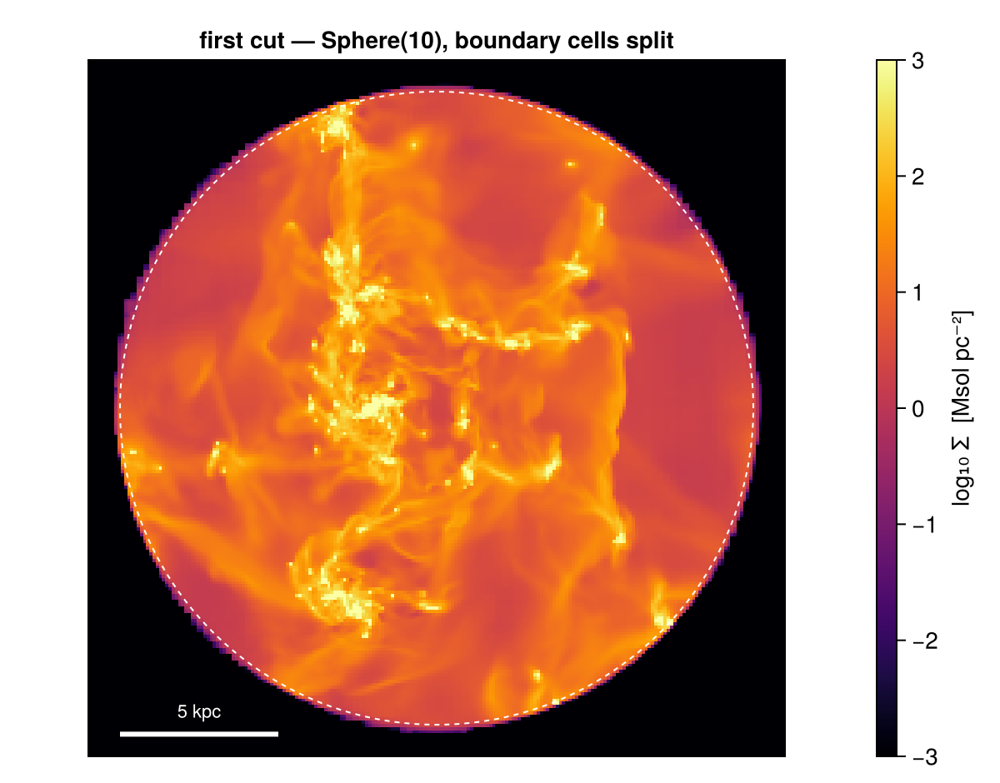

In [4]:
hello = subregion(gas, Sphere(10.), verbose=false)   # center=[:bc], range_unit=:kpc are the defaults

println("returned type       : ", typeof(hello).name.name, "  (same as gas — fully chainable)")
println("cells selected      : ", length(hello.data), "  of ", length(gas.data))
println("gas mass, r < 10 kpc: ", round(msum(hello, :Msol), sigdigits=5), " Msol")

ph = proj(hello; xrange=[-11, 11], yrange=[-11, 11], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(600, 470))
ax  = Axis(fig[1, 1], title="first cut — Sphere(10), boundary cells split")
show_sd!(ax, ph, (-11, 11, -11, 11))
arc!(ax, Point2f(0, 0), 10., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
scalebar!(ax, -10, -10.3, 5)
sd_bar!(fig[1, 2])
fig

The three printed lines are the anatomy of every extraction on this page: a
region value, a chainable result, a number. The dashed circle is the *analytic*
sphere — the rendered gas ends on it because straddling cells contribute only
their inside fraction.

!!! tip "Try it"
    Change the radius to `Sphere(5.)` and re-run the cell. The selected cell
    count drops far more steeply than the radius — you are cutting into the
    refined, gas-rich disc — while the mass falls only moderately: most of this
    galaxy's gas lives well inside 10 kpc.

## 3. One Sphere, Three Masses

Now the calibration promised in the plan. We place the same 10 kpc sphere
**off-centre**, at x = 13 kpc (box-centre height in y and z), so its surface
sweeps from fine disc cells into coarse cells near the box edge — exactly the
situation where boundary cells matter. Before measuring it, look at what the
three treatments *do* to a boundary, on a grid small enough to see every cell.
The cartoon below is not simulation data; it is the algorithm itself, drawn —
including a refined patch in the upper-right quadrant, because on an AMR mesh
the same circle crosses cells of different sizes.

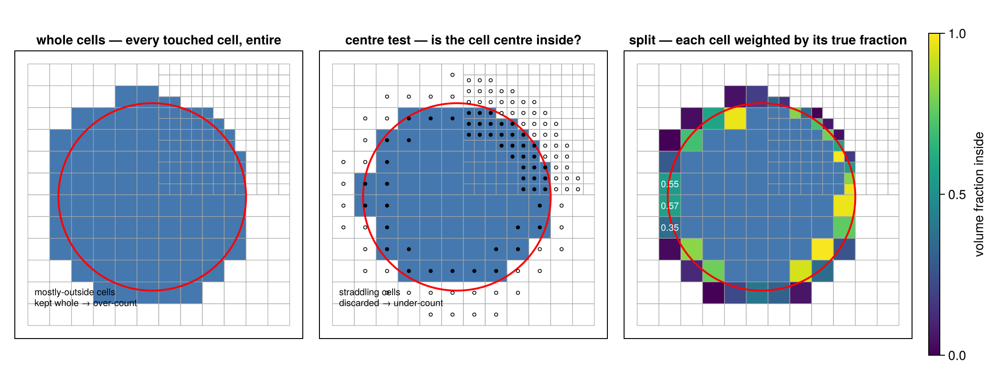

In [5]:
# ── ILLUSTRATION ONLY: this cell just DRAWS the split-cell schematic — no
# ── simulation data. Skim it if you trust the picture; the concepts resume
# ── in the next cell.
# a drawn 12×12 patch of an AMR grid (coarse 1-unit cells, one 2× refined
# quadrant) and one circular region — which cells does each treatment keep?
cells = Tuple{Float64,Float64,Float64}[]          # (x0, y0, cell size)
for i in 0:11, j in 0:11
    if i >= 6 && j >= 6                           # the refined quadrant
        for di in 0:1, dj in 0:1
            push!(cells, (i + 0.5di, j + 0.5dj, 0.5))
        end
    else
        push!(cells, (Float64(i), Float64(j), 1.0))
    end
end
ccx, ccy, R = 5.7, 5.9, 4.3                       # a circle grazing both mesh scales
inside(x, y) = (x - ccx)^2 + (y - ccy)^2 <= R^2
function insidefrac(x0, y0, s; n=32)              # inside fraction by sub-sampling — what `nsub` does
    hits = 0
    for a in 1:n, b in 1:n
        hits += inside(x0 + s*(a-0.5)/n, y0 + s*(b-0.5)/n)
    end
    return hits / n^2
end
F = [insidefrac(c...) for c in cells]
θ = range(0, 2π; length=181)


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(1080, 400))
titles = ("whole cells — every touched cell, entire",
          "centre test — is the cell centre inside?",
          "split — each cell weighted by its true fraction")
axs = [Axis(fig[1, k]; title=titles[k], aspect=DataAspect()) for k in 1:3]
foreach(hidedecorations!, axs)
for (k, ax) in enumerate(axs)
    for (ci, (x0, y0, s)) in enumerate(cells)
        keep = k == 2 ? inside(x0 + s/2, y0 + s/2) : F[ci] > 0
        col = if !keep
            :white
        elseif k < 3 || F[ci] >= 1
            RGBf(0.27, 0.47, 0.68)                # counted in full
        else
            get(cgrad(:viridis), F[ci])           # boundary cell: weight = inside fraction
        end
        poly!(ax, Rect2f(x0, y0, s, s); color=col, strokecolor=:gray65, strokewidth=0.6)
    end
    lines!(ax, ccx .+ R .* cos.(θ), ccy .+ R .* sin.(θ); color=:red, linewidth=2)
end
let  # centre dots near the rim of panel 2: filled = centre inside, hollow = outside
    for (x0, y0, s) in cells
        xm, ym = x0 + s/2, y0 + s/2
        abs(sqrt((xm-ccx)^2 + (ym-ccy)^2) - R) < 1.4 || continue
        scatter!(axs[2], [xm], [ym]; color=inside(xm, ym) ? :black : :white,
                 strokecolor=:black, strokewidth=0.8, markersize=5)
    end
end
let  # fraction labels on a few coarse boundary cells of panel 3
    shown = 0
    for (ci, (x0, y0, s)) in enumerate(cells)
        if s == 1.0 && 0.1 < F[ci] < 0.95 && x0 < ccx && shown < 3
            text!(axs[3], x0 + 0.5, y0 + 0.5; text=string(round(F[ci], digits=2)),
                  align=(:center, :center), fontsize=10, color=:white)
            shown += 1
        end
    end
end
text!(axs[1], 0.3, 0.8; text="mostly-outside cells\nkept whole → over-count", fontsize=10, color=:black)
text!(axs[2], 0.3, 0.8; text="straddling cells\ndiscarded → under-count", fontsize=10, color=:black)
Colorbar(fig[1, 4]; colormap=:viridis, colorrange=(0, 1), label="volume fraction inside")
fig

Note how the damage scales with cell size: in the refined quadrant all three
panels nearly agree, while the coarse cells on the left carry the big errors.
That is the whole boundary problem in one picture — and it is why the bracket
below shrinks with resolution but never quite closes.

Now the same three treatments on real data — and all three come out of *one*
value-type extraction. The split call is the reference. `split=false` applies
the centre test instead (whole cells, no `:fraction` column). And the
whole-cell answer needs no third machinery at all: take the split result and
**drop its `:fraction` column** — every touched cell then counts in full,
which is exactly what "keep every intersecting cell whole" means. (The classic
symbol API offers the same two alternatives as `cell=true` / `cell=false`
switches — see §12.)

In [6]:
ctr = [13., :bc, :bc]   # x = 13 kpc; box centre in y and z

sph        = subregion(gas, Sphere(10.; center=ctr, range_unit=:kpc), verbose=false)  # split
sph_centre = subregion(gas, Sphere(10.; center=ctr, range_unit=:kpc);
                       split=false, verbose=false)                    # centre-inside cells, whole

# whole-cell mode = the split selection with its :fraction column removed:
cols_keep = Tuple(filter(!=(:fraction), propertynames(Mera.columns(sph.data))))
sph_whole = Mera.construct_datatype(Mera.select(sph.data, cols_keep), sph)

m_upper = msum(sph_whole,  :Msol)
m_lower = msum(sph_centre, :Msol)
m_exact = msum(sph,        :Msol)

println("gas mass inside r = 10 kpc:")
println("  whole cells  (no :fraction) : ", round(m_upper, sigdigits=6), " Msol   +",
        round(100*(m_upper/m_exact - 1), sigdigits=3), " % vs split")
println("  centre test  (split=false)  : ", round(m_lower, sigdigits=6), " Msol   ",
        round(100*(m_lower/m_exact - 1), sigdigits=3), " % vs split")
println("  split        (:fraction)    : ", round(m_exact, sigdigits=6), " Msol   reference")

gas mass inside r = 10 kpc:


  whole cells  (no :fraction) : 1.19933e10 Msol   +0.332 % vs split
  centre test  (split=false)  : 1.19536e10 Msol   -0.00125 % vs split
  split        (:fraction)    : 1.19537e10 Msol   reference


Read the two deviations carefully, because they are of different kinds. The
whole-cell mode is a **strict upper bound**: its selection contains the split
selection with every straddling cell at full weight, so it can only sit above.
The centre test carries **no guarantee at all**: the straddlers it keeps
over-count, the ones it discards under-count, and the two effects largely
cancel — it typically lands very close to the split value, on *either* side
(§4's ring makes that concrete). The distance between the three answers is set
by the size of the cells the boundary happens to cross; it shrinks with
refinement, but at any finite resolution the split value is the answer to
quote, and the whole-cell excess is a fair measure of how much the boundary
cells matter.

**How exact are the fractions themselves?** Honestly: exact to the accuracy of
a sub-sampling. For curved regions Mera estimates each boundary cell's inside
fraction by testing an `nsub`×`nsub`×`nsub` lattice of points per cell
(default `nsub=8`, i.e. 512 samples; only axis-aligned `Cuboid` overlaps are
computed analytically). We can *measure* that accuracy, because the split
sphere's volume has an analytic truth, (4/3)πR³ — and we can buy it down by
raising `nsub`:

In [7]:
v8    = sum(getvar(sph, :volume, :kpc3))
sph32 = subregion(gas, Sphere(10.; center=ctr, range_unit=:kpc); nsub=32, verbose=false)
v32   = sum(getvar(sph32, :volume, :kpc3))
v_ana = 4π/3 * 10.0^3
sph32 = nothing

println("(4/3) π R³                    : ", round(v_ana, sigdigits=6), " kpc³")
println("split-cell volume, nsub = 8   : ", round(v8,  sigdigits=6), " kpc³   (",
        round(100*(v8/v_ana - 1),  sigdigits=2), " %)")
println("split-cell volume, nsub = 32  : ", round(v32, sigdigits=6), " kpc³   (",
        round(100*(v32/v_ana - 1), sigdigits=2), " %)")

(4/3) π R³                    : 4188.79

 kpc³
split-cell volume, nsub = 8   : 4188.6 kpc³   (-0.0046 %)
split-cell volume, nsub = 32  : 4188.77 kpc³   (-0.00036 %)


The default's deviation lives almost entirely in the *coarse* boundary cells
on the sphere's far side — a handful of samples must stand in for a large
volume. Raising `nsub` shrinks it at proportional cost. Keep the default for
everyday work; raise it when a boundary crosses very coarse cells *and* the
last decimals matter.

Now the pictures that explain the numbers — and, in the second row, a zoom
onto the coarse western rim, because at full-figure scale the fine-side
differences are smaller than a display pixel. The dashed circle is the
analytic sphere; measure each treatment against it.

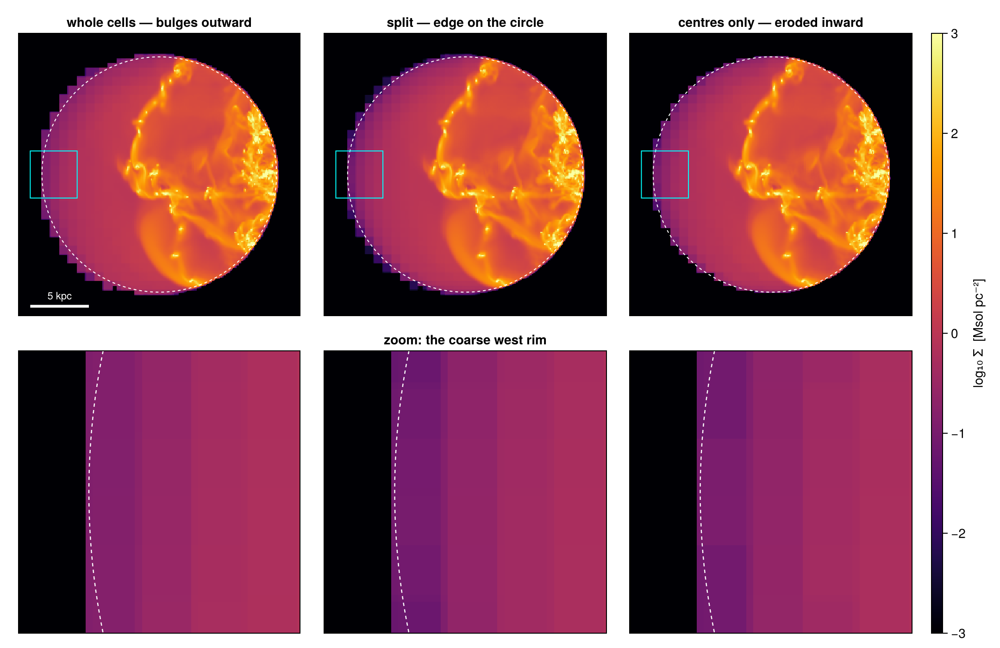

In [8]:
zoomw = (center=ctr, xrange=[-12, 12], yrange=[-12, 12], pxsize=[0.1, :kpc])

p_up = proj(sph_whole;  zoomw...)
p_sp = proj(sph;        zoomw...)
p_lo = proj(sph_centre; zoomw...)

fig  = Figure(size=(1080, 700))
L    = (-12, 12, -12, 12)
Lz   = (-11, -7, -2, 2)                              # the coarse west rim
panels = ((p_up, "whole cells — bulges outward"),
          (p_sp, "split — edge on the circle"),
          (p_lo, "centres only — eroded inward"))
for (k, (p, ttl)) in enumerate(panels)
    ax = Axis(fig[1, k], title=ttl)
    show_sd!(ax, p, L)
    arc!(ax, Point2f(0, 0), 10., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
    lines!(ax, [-11, -7, -7, -11, -11], [-2, -2, 2, 2, -2]; color=:cyan, linewidth=1)
    axz = Axis(fig[2, k], title=k == 2 ? "zoom: the coarse west rim" : "")
    show_sd!(axz, p, Lz)
    arc!(axz, Point2f(0, 0), 10., 0, 2π; color=:white, linewidth=1.2, linestyle=:dash)
end
scalebar!(content(fig[1, 1]), -11, -11.2, 5)
sd_bar!(fig[:, 4])
fig

In the zoom the three verdicts of the cartoon reappear on real data: whole
coarse blocks overshoot the dashed circle, the centre test bites visibly into
it, and the split edge feathers *on* it — the residual softness is the
projection depositing each straddling cell's (correctly weighted) mass over
its full footprint, a point §7 returns to and measures.

And here is what "splitting" means cell by cell. We take the split sphere's
*boundary* cells (those with `0 < fraction < 1`) in a thin mid-plane slab and
colour each cell by its inside fraction — the measured counterpart of the
cartoon's third panel, down to the shared colormap. Marker size is drawn
proportional to cell size.

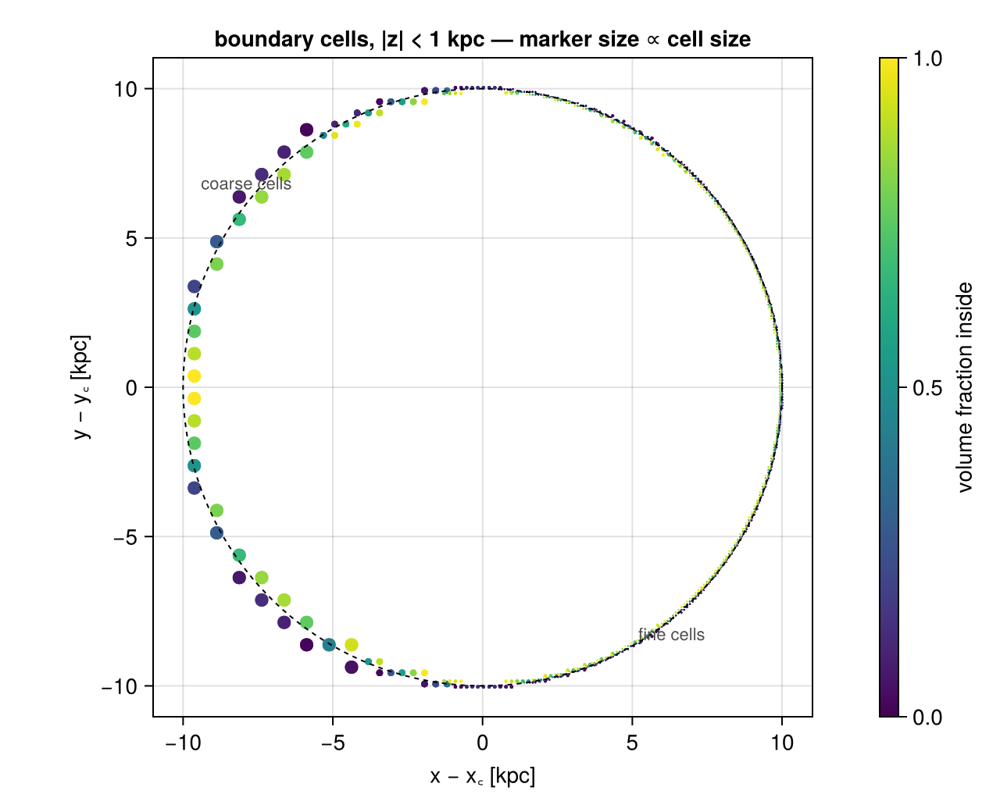

In [9]:
cs = getvar(sph, :cellsize, :kpc)
xr = getvar(sph, :x, :kpc) .- 13.   # cell centres relative to the sphere centre
yr = getvar(sph, :y, :kpc) .- 24.   #  (x = 13, y = z = 24 kpc)
zr = getvar(sph, :z, :kpc) .- 24.
f  = Mera.select(sph.data, :fraction)

sel = (f .< 1.0) .& (abs.(zr) .< 1.)   # boundary cells in a thin mid-plane slab


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(640, 520))
ax  = Axis(fig[1, 1], title="boundary cells, |z| < 1 kpc — marker size ∝ cell size",
           xlabel="x − x꜀ [kpc]", ylabel="y − y꜀ [kpc]", aspect=DataAspect())
sc  = scatter!(ax, xr[sel], yr[sel]; color=f[sel], colormap=:viridis,
               colorrange=(0, 1), markersize=16 .* cs[sel])
lines!(ax, 10 .* cos.(θ), 10 .* sin.(θ); color=:black, linewidth=1, linestyle=:dash)
text!(ax, -9.4,  6.5; text="coarse cells", color=:gray30, fontsize=11)
text!(ax,  5.2, -8.6; text="fine cells",   color=:gray30, fontsize=11)
Colorbar(fig[1, 2], sc, label="volume fraction inside")
fig

The fractions straddle the dashed analytic circle, exactly as drawn in the
cartoon — and the AMR structure of the boundary is now explicit: toward the
galaxy (lower right) the circle crosses many small cells, toward the box edge
(upper left) a few large ones. Those few large ones are where the mass bracket
and the volume deviation above come from.

**The same bracket, where the mesh is coarse.** One more measurement drives
the lesson home. The calibration sphere's boundary still lives mostly in
moderately refined gas; place a *small* sphere high above the disc plane,
where the refinement criteria never triggered, and the whole-cell excess
explodes — the systematic uncertainty of a whole-cell cut is set by the local
cell size at the boundary, not by the overall quality of the simulation:

In [10]:
ctr_c = [:bc, :bc, 32.]                       # 8 kpc above the plane — coarse mesh
sph_c  = subregion(gas, Sphere(1.5; center=ctr_c, range_unit=:kpc), verbose=false)
sph_cc = subregion(gas, Sphere(1.5; center=ctr_c, range_unit=:kpc); split=false, verbose=false)
cols_c = Tuple(filter(!=(:fraction), propertynames(Mera.columns(sph_c.data))))
sph_cw = Mera.construct_datatype(Mera.select(sph_c.data, cols_c), sph_c)

mc_u, mc_l, mc_e = msum(sph_cw, :Msol), msum(sph_cc, :Msol), msum(sph_c, :Msol)
println("gas mass inside r = 1.5 kpc, 8 kpc above the plane:")
println("  whole cells : +", round(100*(mc_u/mc_e - 1), sigdigits=3), " % vs split")
println("  centre test : ", round(100*(mc_l/mc_e - 1), sigdigits=3), " % vs split")
println("  split       : ", round(mc_e, sigdigits=5), " Msol   reference   (",
        length(sph_c.data), " cells, largest ",
        round(maximum(getvar(sph_c, :cellsize, :kpc)), digits=3), " kpc)")

gas mass inside r = 1.5 kpc, 8 kpc above the plane:


  whole cells : +93.3 % vs split
  centre test : 19.1 % vs split
  split       : 560090.0 Msol   reference   (66 cells, largest 0.75 kpc)


Nearly a factor of two — from the same machinery that was sub-per-cent on
the disc sphere — and even the centre test lands ~20 % off, because up here
the boundary crosses a few dozen cells comparable in size to the region
itself. Whenever you cut something small or something far
from the refined regions, run this three-line comparison before trusting a
whole-cell number.

## 4. The Budget, Piece by Piece

Calibration done — we know what to use (split regions), what the alternatives
cost, and how to read a rendered edge. Now the galaxy. The budget of §6 will
tile the disc into the four zones of the dissection plan; this chapter cuts
each structure, measures it, and uses each one to introduce one more piece of
the machinery.

**The disc.** A rotating disc calls for a cylinder: `Cylinder(12., 2.)` —
radius 12 kpc and **half-height** 2 kpc (the slab spans |z| ≤ 2 kpc), centred
on the box. Note the convention once and for all: the second argument is
always the half-height. We extract it twice, split and with `split=false`
(the centre test, no `:fraction` column), to carry the §3 lesson to a real
component:

In [11]:
disc_region = Cylinder(12., 2.; center=[:bc], range_unit=:kpc)   # radius, half-height

disc       = subregion(gas, disc_region, verbose=false)                 # split boundary cells
disc_whole = subregion(gas, disc_region; split=false, verbose=false)    # centre test

m_disc  = msum(disc,       :Msol)
m_discw = msum(disc_whole, :Msol)
println("disc gas mass (r < 12 kpc, |z| < 2 kpc):")
println("  split       : ", round(m_disc,  sigdigits=6), " Msol")
println("  split=false : ", round(m_discw, sigdigits=6), " Msol   (",
        round(100*(m_discw/m_disc - 1), sigdigits=3), " %)")

disc gas mass (r < 12 kpc, |z| < 2 kpc):


  split       : 2.28346e10 Msol
  split=false : 2.28475e10 Msol   (0.0563 %)


The residual is tiny here — the disc mid-plane is highly refined, so the
boundary crosses small cells almost everywhere. Where the choice does matter is
*above* the plane: edge-on, the cylinder's flat faces at z = ±2 kpc (dashed)
cut through the coarser cells of the thick-gas layer. The split face feathers
smoothly past the dashed surface — each straddling cell's correctly-weighted
mass rendered over its full footprint, a projection effect §7 measures — while
the centre-tested face ends in a hard edge stepped by whole cells.

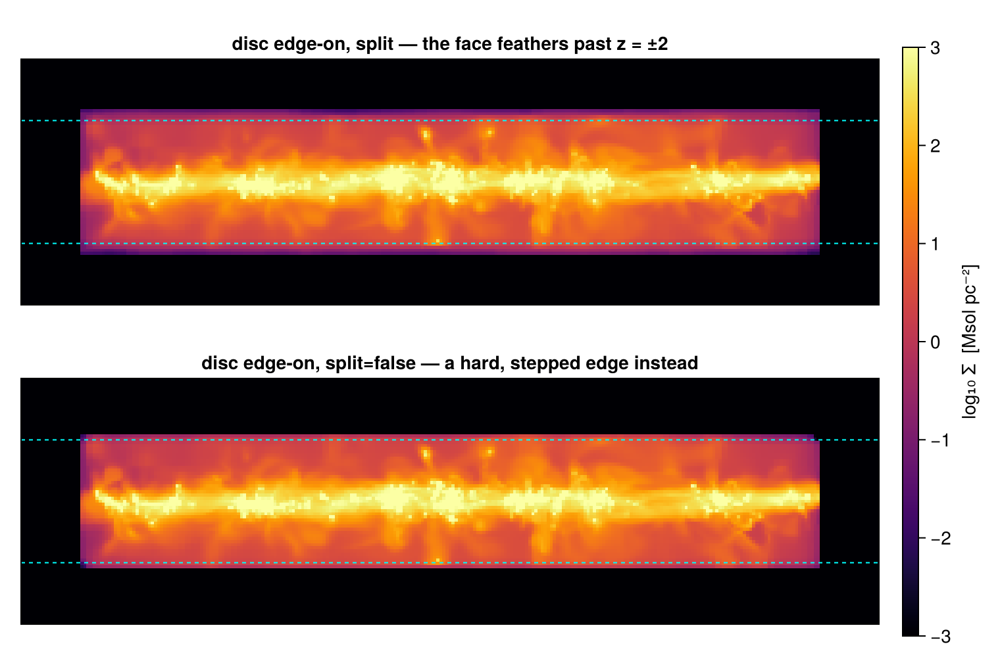

In [12]:
p3 = proj(disc;       direction=:x, yrange=[-14, 14], zrange=[-4, 4], pxsize=[0.1, :kpc])
p4 = proj(disc_whole; direction=:x, yrange=[-14, 14], zrange=[-4, 4], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(760, 500))
Le  = (-14, 14, -4, 4)
ax1 = Axis(fig[1, 1], title="disc edge-on, split — the face feathers past z = ±2")
show_sd!(ax1, p3, Le)
ax2 = Axis(fig[2, 1], title="disc edge-on, split=false — a hard, stepped edge instead")
show_sd!(ax2, p4, Le)
for ax in (ax1, ax2), zpl in (-2., 2.)
    lines!(ax, [-14., 14.], [zpl, zpl]; color=:cyan, linewidth=1, linestyle=:dash)
end
sd_bar!(fig[:, 2])
fig

**The nucleus zone — and every region's inverse.** The innermost budget zone
is `Cylinder(4., 2.)`. Every region also defines its complement: with
`inverse=true` the selection flips, and so do the fractions
(`fraction → 1 − fraction`), so a boundary cell's material is shared between a
region and its inverse with nothing counted twice and nothing lost. That makes
region + inverse a *partition* of the whole box — our first balance check,
and the mechanism the final ledger rests on.

One practical lesson rides along in the figure: a hole selected out of a
48-kpc-deep line of sight is nearly invisible — sightlines through the missing
cylinder still cross all the gas in front of and behind it. To *see* an
excavation, restrict the projection depth to the feature (here `zrange=[-2, 2]`,
matching the slab). Both panels below state that in the title.

nucleus zone          : 5.93727e9

 Msol
nucleus + inverse     : 3.0400672e10 Msol
whole box             : 3.0400672e10 Msol
relative imbalance    : 0.0


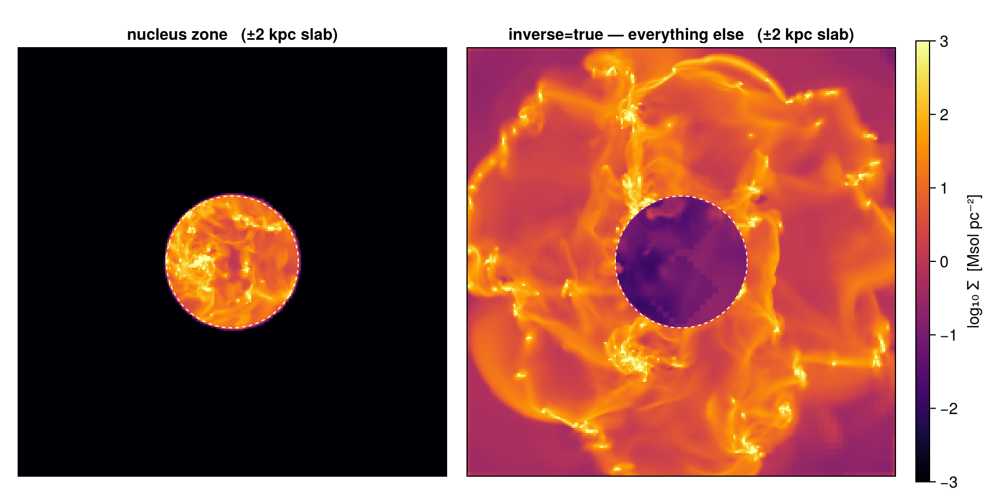

In [13]:
nucleus_region = Cylinder(4., 2.; center=[:bc], range_unit=:kpc)

nucleus = subregion(gas, nucleus_region, verbose=false)
anti    = subregion(gas, nucleus_region; inverse=true, verbose=false)

m_nuc, m_anti, m_tot = msum(nucleus, :Msol), msum(anti, :Msol), msum(gas, :Msol)
println("nucleus zone          : ", round(m_nuc,  sigdigits=6), " Msol")
println("nucleus + inverse     : ", round(m_nuc + m_anti, sigdigits=8), " Msol")
println("whole box             : ", round(m_tot,          sigdigits=8), " Msol")
println("relative imbalance    : ", round((m_nuc + m_anti)/m_tot - 1, sigdigits=2))

pn = proj(nucleus; xrange=[-13, 13], yrange=[-13, 13], zrange=[-2, 2], pxsize=[0.1, :kpc])
pa = proj(anti;    xrange=[-13, 13], yrange=[-13, 13], zrange=[-2, 2], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(880, 440))
Ln  = (-13, 13, -13, 13)
ax1 = Axis(fig[1, 1], title="nucleus zone   (±2 kpc slab)")
ax2 = Axis(fig[1, 2], title="inverse=true — everything else   (±2 kpc slab)")
show_sd!(ax1, pn, Ln); show_sd!(ax2, pa, Ln)
for ax in (ax1, ax2)
    arc!(ax, Point2f(0, 0), 4., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
end
sd_bar!(fig[1, 3])
fig

The two panels are literal complements: the gas missing from one is exactly
the gas of the other, and their masses close on the box total to
floating-point accuracy. Because the projection depth matches the slab, the
excavated cylinder reads as a real void — though not a perfectly black one:
the boundary cells' remaining fractions render over their full cell
footprints, leaving a faint glow and a stepped rim just inside the dashed
circle. That is the same footprint feathering §7 measures (and `refine`
sharpens); the *integrals* above closed exactly regardless.

**The star-forming ring.** Dense gas often organises into rings; ours sits
between 6 and 10 kpc. `CylindricalShell(6., 10., 2.)` selects that annulus
within the ±2 kpc slab (inner radius first; both radii must be nonzero — the
constructors guard against degenerate shells). A shell has *two* boundary
surfaces, so the centre test now misjudges straddlers on *two* rims at once —
its residual is the net of four small effects and can land on either side of
the split value, which is why §3 called it an estimate rather than a bound.
We also cut the ring's **inverse** — everything *except* the annulus — both as
a second partition check and because a "disc with a gap" is a shape worth
having in the toolbox:

ring gas mass (6 < r < 10 kpc, |z| < 2 kpc):


  split       : 8.03224e9 Msol
  split=false : 8.02745e9 Msol   (-0.0596 % — net of two rims' cancelling errors)
ring + inverse = box?  1.0

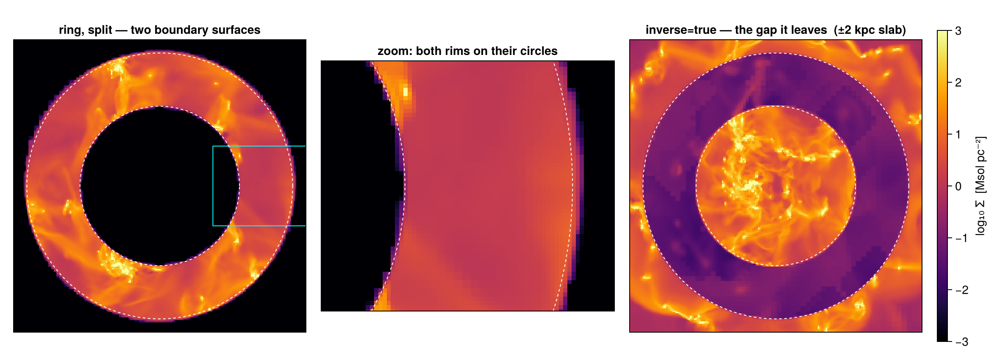

In [14]:
ring_region = CylindricalShell(6., 10., 2.; center=[:bc], range_unit=:kpc)

ring     = subregion(gas, ring_region, verbose=false)
ring_ctr = subregion(gas, ring_region; split=false, verbose=false)

m_ring  = msum(ring,     :Msol)
m_ringc = msum(ring_ctr, :Msol)
println("ring gas mass (6 < r < 10 kpc, |z| < 2 kpc):")
println("  split       : ", round(m_ring,  sigdigits=6), " Msol")
println("  split=false : ", round(m_ringc, sigdigits=6), " Msol   (",
        round(100*(m_ringc/m_ring - 1), sigdigits=3), " % — net of two rims' cancelling errors)")

ring_inv = subregion(gas, ring_region; inverse=true, verbose=false)
println("ring + inverse = box?  ",
        round((msum(ring, :Msol) + msum(ring_inv, :Msol))/msum(gas, :Msol), digits=10))

pr  = proj(ring;     xrange=[-11, 11], yrange=[-11, 11], pxsize=[0.1, :kpc])
pri = proj(ring_inv; xrange=[-11, 11], yrange=[-11, 11], zrange=[-2, 2], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(1180, 420))
ax1 = Axis(fig[1, 1], title="ring, split — two boundary surfaces")
show_sd!(ax1, pr, (-11, 11, -11, 11))
lines!(ax1, [4, 11, 11, 4, 4], [-3, -3, 3, 3, -3]; color=:cyan, linewidth=1)
ax2 = Axis(fig[1, 2], title="zoom: both rims on their circles")
show_sd!(ax2, pr, (4, 11, -3, 3))
ax3 = Axis(fig[1, 3], title="inverse=true — the gap it leaves  (±2 kpc slab)")
show_sd!(ax3, pri, (-11, 11, -11, 11))
for ax in (ax1, ax2, ax3), r in (6., 10.)
    arc!(ax, Point2f(0, 0), r, 0, 2π; color=:white, linewidth=1, linestyle=:dash)
end
sd_bar!(fig[1, 4])
fig

**The envelope — sharing a surface without double counting.** Outside the
disc, a CGM-like envelope: `SphericalShell(10., 20.)`. Its inner surface is
the *same* r = 10 kpc sphere we cut in §2 (`hello`), which lets us fire the
partition claim as a number: shell and enclosed sphere share the boundary
cells at r = 10 via complementary fractions, so their masses must sum to the
mass of a plain 20 kpc sphere.

envelope (10–20 kpc)      : 1.18046e10

 Msol
enclosed sphere (< 10)    : 1.82103e10 Msol
sum                       : 3.0014956e10 Msol
plain Sphere(20) directly : 3.0014956e10 Msol


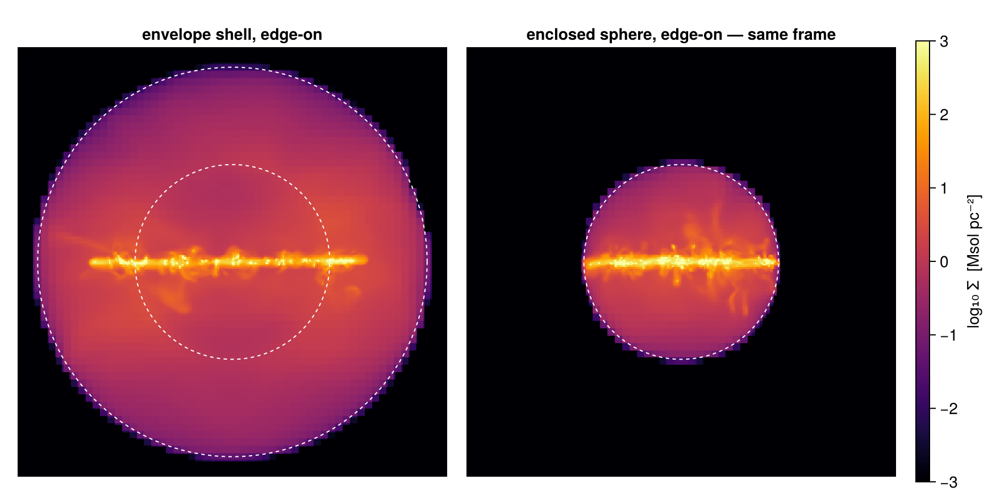

In [15]:
env_region = SphericalShell(10., 20.; center=[:bc], range_unit=:kpc)

env    = subregion(gas, env_region, verbose=false)
sph20  = subregion(gas, Sphere(20.), verbose=false)

m_env, m_hello, m_20 = msum(env, :Msol), msum(hello, :Msol), msum(sph20, :Msol)
println("envelope (10–20 kpc)      : ", round(m_env,   sigdigits=6), " Msol")
println("enclosed sphere (< 10)    : ", round(m_hello, sigdigits=6), " Msol")
println("sum                       : ", round(m_env + m_hello, sigdigits=8), " Msol")
println("plain Sphere(20) directly : ", round(m_20,            sigdigits=8), " Msol")
sph20 = nothing

pe1 = proj(env;   direction=:x, yrange=[-22, 22], zrange=[-22, 22], pxsize=[0.15, :kpc])
pe2 = proj(hello; direction=:x, yrange=[-22, 22], zrange=[-22, 22], pxsize=[0.15, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(880, 440))
Lv  = (-22, 22, -22, 22)
ax1 = Axis(fig[1, 1], title="envelope shell, edge-on")
ax2 = Axis(fig[1, 2], title="enclosed sphere, edge-on — same frame")
show_sd!(ax1, pe1, Lv); show_sd!(ax2, pe2, Lv)
arc!(ax1, Point2f(0, 0), 10., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
arc!(ax1, Point2f(0, 0), 20., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
arc!(ax2, Point2f(0, 0), 10., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
sd_bar!(fig[1, 3])
fig

Both panels share one frame (±22 kpc) and the page's one colour scale, so the
size relation and the brightness relation are real. The dashed r = 10 kpc
circle appears in both: it is the *shared* surface — outer wall of the sphere,
inner wall of the shell — and the printed sum shows its straddling cells being
divided between the two without loss. The envelope stays outside the §6
budget (it is a spherical component, deliberately not part of the disc
tiling), but it is measured with the same guarantee.

## 5. Region Algebra: Composing Regions

Regions are values, so they compose with the set operators `∩` (also `&`),
`∪` (also `|`), `\` (difference), and `!` (complement) — arbitrarily nested,
with a different centre allowed in every part, and the composite's boundary
cells are still fraction-weighted (curved composite surfaces are sub-sampled
per cell; `nsub` from §3 controls how finely).

!!! tip "Typing the operators"
    `∪` and `∩` are the mathematical set-union and set-intersection symbols.
    In the Julia REPL, Jupyter, and VS Code you get them by LaTeX-style tab
    completion: type `\cup` then press TAB for `∪`, and `\cap` TAB for `∩`
    (`\` difference and `!` complement are plain ASCII already). If you
    prefer to avoid Unicode entirely, every operator has an ASCII equivalent:
    `A ∪ B` == `A | B` == `union(A, B)`, `A ∩ B` == `A & B` ==
    `intersect(A, B)`, and `A \ B` == `setdiff(A, B)`.

The classic use case: a "disc without the bulge". Subtracting a 4-kpc
**sphere** from the disc cylinder has one subtlety that makes it a good
example — the sphere pokes *above and below* the ±2 kpc slab, so the mass it
removes from the disc is not the full sphere mass but the mass of
`disc ∩ sphere`. The algebra keeps that book for us:

disc \ sphere : 1.69318e10

 Msol
disc ∩ sphere : 5.90283e9 Msol
sum           : 2.2834624e10   vs disc: 2.2834625e10 Msol


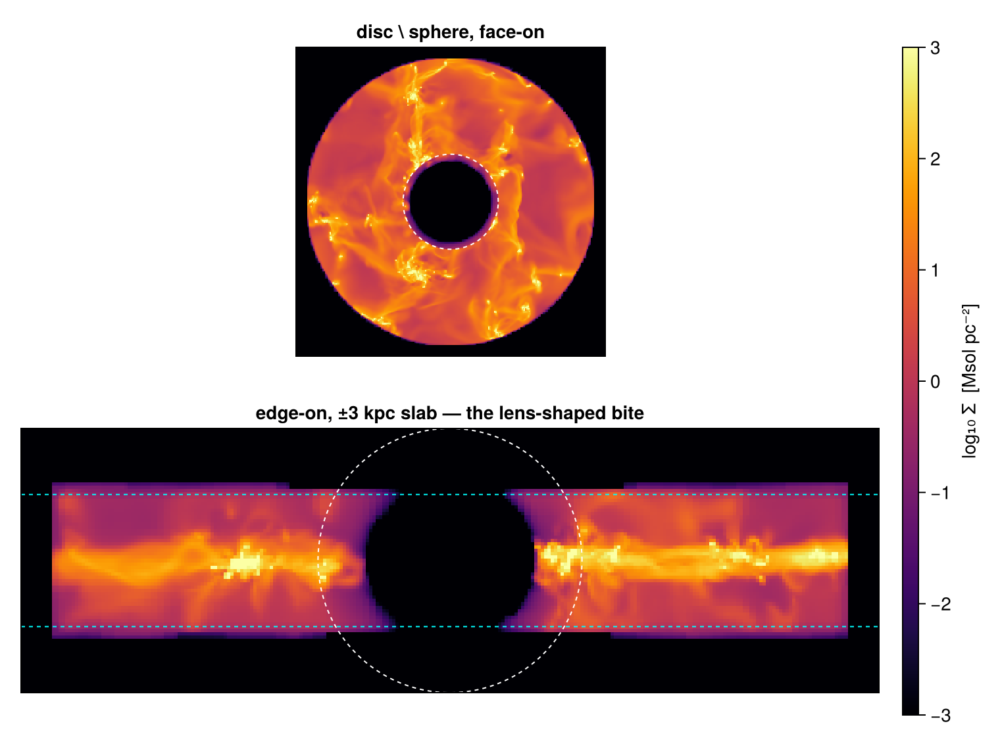

In [16]:
bulge_sphere = Sphere(4.; center=[:bc], range_unit=:kpc)

clean_disc = subregion(gas, disc_region \ bulge_sphere, verbose=false)
overlap    = subregion(gas, disc_region ∩ bulge_sphere, verbose=false)

m_clean = msum(clean_disc, :Msol)
m_olap  = msum(overlap,    :Msol)

println("disc \\ sphere : ", round(m_clean, sigdigits=6), " Msol")
println("disc ∩ sphere : ", round(m_olap,  sigdigits=6), " Msol")
println("sum           : ", round(m_clean + m_olap, sigdigits=8),
        "   vs disc: ", round(m_disc, sigdigits=8), " Msol")

pc1 = proj(clean_disc; xrange=[-13, 13], yrange=[-13, 13], pxsize=[0.1, :kpc])
pc2 = proj(clean_disc; direction=:x, xrange=[-3, 3], yrange=[-13, 13], zrange=[-4, 4],
           pxsize=[0.1, :kpc])                    # depth-restricted: the bite is visible


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(760, 560))
ax1 = Axis(fig[1, 1], title="disc \\ sphere, face-on")
show_sd!(ax1, pc1, (-13, 13, -13, 13))
arc!(ax1, Point2f(0, 0), 4., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
ax2 = Axis(fig[2, 1], title="edge-on, ±3 kpc slab — the lens-shaped bite")
show_sd!(ax2, pc2, (-13, 13, -4, 4))
arc!(ax2, Point2f(0, 0), 4., 0, 2π; color=:white, linewidth=1, linestyle=:dash)
for zpl in (-2., 2.)
    lines!(ax2, [-13., 13.], [zpl, zpl]; color=:cyan, linewidth=1, linestyle=:dash)
end
sd_bar!(fig[:, 2])
fig

The printed sum closes on the disc mass — difference and intersection
partition the disc just as region and inverse partitioned the box. In the
edge-on panel the line of sight is restricted to a ±3 kpc slab (the §4
lesson), so the sphere's bite out of the slab reads as the lens-shaped dark
region between the dashed slab faces, not as a faint dimming.

Nothing limits composition to two parts. Below, a deliberately playful carve —
the disc unioned with an off-centre 5-kpc "companion" sphere, minus two
drilled holes — in one expression, every piece with its own centre. The two
holes look different for a real geometric reason, annotated in the figure:

sculpture gas mass: 2.25759e10

 Msol


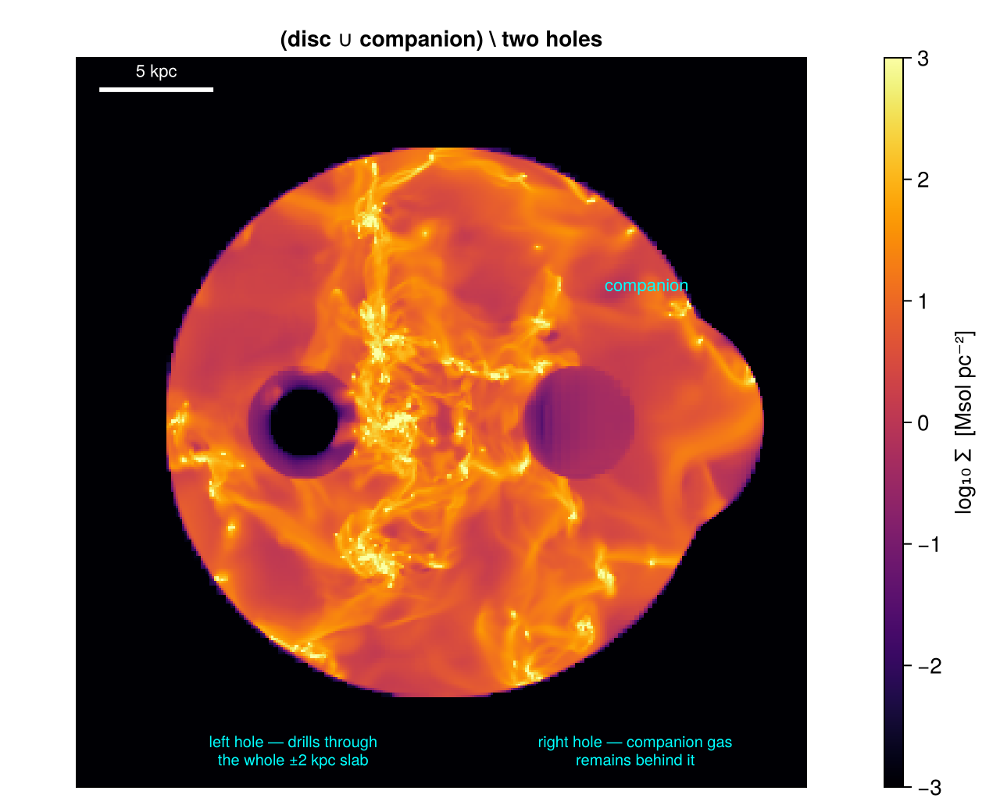

In [17]:
sculpture = (disc_region ∪ Sphere(5.; center=[33., :bc, :bc], range_unit=:kpc)) \
            (Sphere(2.5; center=[18., :bc, :bc], range_unit=:kpc) ∪
             Sphere(2.5; center=[30., :bc, :bc], range_unit=:kpc))

carve = subregion(gas, sculpture, verbose=false)
println("sculpture gas mass: ", round(msum(carve, :Msol), sigdigits=6), " Msol")

ps = proj(carve; xrange=[-16, 16], yrange=[-16, 16], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(640, 520))
ax  = Axis(fig[1, 1], title="(disc ∪ companion) \\ two holes")
show_sd!(ax, ps, (-16, 16, -16, 16))
text!(ax,  9.0,  5.6; text="companion", color=:cyan, fontsize=11, align=(:center, :bottom))
text!(ax, -6.5, -13.6; text="left hole — drills through\nthe whole ±2 kpc slab", color=:cyan,
      fontsize=10, align=(:center, :top))
text!(ax,  8.5, -13.6; text="right hole — companion gas\nremains behind it", color=:cyan,
      fontsize=10, align=(:center, :top))
scalebar!(ax, -15, 14.6, 5)
sd_bar!(fig[1, 2])
fig

The left hole is black: its 2.5-kpc drill radius exceeds the disc's 2-kpc
half-height, so it pierces the slab completely. The right hole only dims: it
sits inside the companion *sphere*, which is thicker than the drill along the
line of sight, so companion gas survives in front of and behind the hole.
Reading a projection of a 3-D carve means reasoning about depth — the two
holes are that lesson in one figure.

**The same carve, as a readable block.** Once a composite grows past two or
three parts, the repeated keywords become noise. The `@region` macro removes
them: constructor calls inside the block inherit the shared `unit`/`center`
(explicitly given ones win), assignments name the parts, and the value that
comes out is an ordinary region — identical to the operator form:

In [18]:
sculpture2 = @region unit=:kpc center=[:bc] begin
    disc      = Cylinder(12., 2.)
    companion = Sphere(5.; center=[33., :bc, :bc])
    holeL     = Sphere(2.5; center=[18., :bc, :bc])
    holeR     = Sphere(2.5; center=[30., :bc, :bc])
    (disc ∪ companion) \ (holeL ∪ holeR)
end

carve2 = subregion(gas, sculpture2, verbose=false)
println("identical to the operator form : ", msum(carve2, :Msol) == msum(carve, :Msol))

identical to the operator form : true

Because the fractions are carried through every operator, set identities hold
*numerically*, not just formally. Inclusion–exclusion for the disc A and the
companion sphere B:

In [19]:
A = disc_region
B = Sphere(5.; center=[33., :bc, :bc], range_unit=:kpc)

volk(r) = sum(getvar(subregion(gas, r, verbose=false), :volume, :kpc3))

vA, vB, vAB, vAuB = volk(A), volk(B), volk(A ∩ B), volk(A ∪ B)
println("vol(A) + vol(B) − vol(A ∩ B) = ", round(vA + vB - vAB, sigdigits=6), " kpc³")
println("vol(A ∪ B)                   = ", round(vAuB, sigdigits=6), " kpc³")

vol(A) + vol(B) − vol(A ∩ B) = 2082.22

 kpc³
vol(A ∪ B)                   = 2082.22 kpc³


!!! tip "Try it"
    A cylindrical shell is itself expressible in the algebra:
    `Cylinder(10., 2.) \ Cylinder(6., 2.)` describes the same annulus as
    `CylindricalShell(6., 10., 2.)`. Extract both and compare `msum` — the
    dedicated shell type computes its fractions in one pass, but the two
    volumes should agree to the sampling accuracy of §3.

## 6. The Ledger: Does It Balance?

The payoff. The four zones of the dissection plan **tile** the disc — same
half-height, radial edges meeting exactly — so their masses must reassemble
the disc mass measured in §4. This is the property that makes a component
table a *budget* rather than a list: overlapping components (a sphere here, a
cylinder there) can easily sum to more gas than the galaxy contains, and
nothing in the table would warn you. Adjacent split regions warn you: they
share every boundary cell via complementary fractions, so the books must
close.

In [20]:
inner_zone = CylindricalShell(4., 6., 2.;  center=[:bc], range_unit=:kpc)
rim_zone   = CylindricalShell(10., 12., 2.; center=[:bc], range_unit=:kpc)

m_inner = msum(subregion(gas, inner_zone, verbose=false), :Msol)
m_rim   = msum(subregion(gas, rim_zone,   verbose=false), :Msol)

zones = [("nucleus — Cylinder(4, ±2 kpc)",             m_nuc),
         ("inner   — CylindricalShell(4–6, ±2 kpc)",   m_inner),
         ("ring    — CylindricalShell(6–10, ±2 kpc)",  m_ring),
         ("rim     — CylindricalShell(10–12, ±2 kpc)", m_rim)]

println(rpad("disc zone", 44), "gas mass [Msol]")
println("-"^60)
for (name, m) in zones
    println(rpad(name, 44), round(m, sigdigits=5))
end
m_sum = sum(last.(zones))
println("-"^60)
println(rpad("sum of the four zones", 44), round(m_sum,  sigdigits=8))
println(rpad("disc, measured directly (§4)", 44), round(m_disc, sigdigits=8))
println(rpad("relative residual", 44), round(m_sum/m_disc - 1, sigdigits=2))

disc zone                                   gas mass [Msol]


------------------------------------------------------------
nucleus — Cylinder(4, ±2 kpc)               5.9373e9
inner   — CylindricalShell(4–6, ±2 kpc)     3.9504e9
ring    — CylindricalShell(6–10, ±2 kpc)    8.0322e9
rim     — CylindricalShell(10–12, ±2 kpc)   4.9147e9
------------------------------------------------------------
sum of the four zones                       2.2834625e10
disc, measured directly (§4)                2.2834625e10
relative residual                           0.0


The ledger balances to floating-point accuracy — not because the numbers were
tuned, but because fraction-weighted regions make additivity a structural
property: every cell on a shared internal edge contributes its inside fraction
to one zone and the complement to the neighbour. The envelope of §4 remains a
separate line of the analysis (a spherical shell cannot tile with cylindrical
zones), which is exactly the kind of statement an honest budget forces you to
make explicit.

## 7. How Exact Is Exact?

Two different questions hide in that phrase, and this page has already
answered the first: **integrals** (mass, volume, anything summed via
`:fraction`) are exact to the boundary-sampling accuracy of §3 — sub-percent
by default, purchasable to better with `nsub`.

And no amount of *boundary refinement* could improve those integrals: a
straddling cell's children inherit their parent's (piecewise-constant)
field values, and their fraction-weighted volumes telescope back to the
parent's — the sum of v·f over the children equals V·f of the parent by
construction. The `:fraction` column already *is* the sub-cell geometry,
integrated. That is why the mass-invariance prints below sit at 1, and why
`refine`/`refine_to` are rendering tools, not accuracy tools.

**Rendered boundaries** are a different matter. A projection deposits each
straddling cell's fraction-weighted mass over the cell's *full* footprint —
the mass is right, but it is spread at the local cell scale, so a split edge
feathers. The bound is simple: rendered mass can appear at most one boundary
cell plus one pixel beyond the analytic surface. When the boundary crosses
coarse cells, that fringe is visibly thick — and `refine=k` buys it down by
subdividing only the boundary cells into their octree children (each child
re-measured, down to depth k), localising the fringe to cellsize/2ᵏ.

We measure both on the disc's flat face, in a small slab around the rim so the
refined extraction stays cheap (refining the *entire* disc boundary of a large
simulation is memory-hungry — scope `refine` to the region you will actually
render):

largest boundary cell in the cut     : 0.375

 kpc
rendered fringe beyond |z| = 2 kpc   :
  refine=0 : 0.265 kpc   (bound: cell + pixel = 0.395 kpc)
  refine=2 : 0.064 kpc
mass invariance, refine=2 / refine=0 : 0.99966


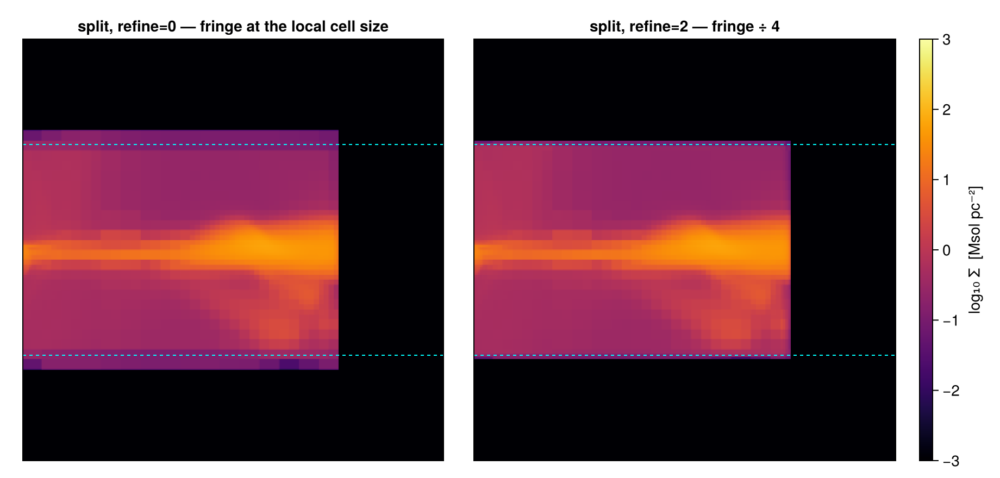

In [21]:
slab  = subregion(gas, :cuboid; xrange=[6., 14.], yrange=[-2., 2.], zrange=[-4., 4.],
                  center=[:bc], range_unit=:kpc, verbose=false)   # a light working slab
d_s0  = subregion(slab, disc_region, verbose=false)               # split, refine=0
d_ref = subregion(slab, disc_region; refine=2, verbose=false)     # boundary subdivided 2×

pe_s0 = projection(d_s0, :sd, :Msol_pc2; direction=:y, center=[:bc], range_unit=:kpc,
                   xrange=[6., 14.], zrange=[-4., 4.], pxsize=[0.02, :kpc],
                   verbose=false, show_progress=false)
pe_r  = projection(d_ref, :sd, :Msol_pc2; direction=:y, center=[:bc], range_unit=:kpc,
                   xrange=[6., 14.], zrange=[-4., 4.], pxsize=[0.02, :kpc],
                   verbose=false, show_progress=false)

zs     = collect(range(pe_s0.cextent[3]*kpc, pe_s0.cextent[4]*kpc; length=size(pe_s0.maps[:sd], 2)))
fringe(p) = maximum(maximum(abs.(zs)[p.maps[:sd][i, :] .> 1e-2]; init=0.0)
                    for i in 1:size(p.maps[:sd], 1)) - 2.0        # kpc beyond the |z| = 2 face
fr  = Mera.select(d_s0.data, :fraction)
csb = getvar(d_s0, :cellsize, :kpc)[0.0 .< fr .< 1.0]             # boundary cells only

println("largest boundary cell in the cut     : ", round(maximum(csb), digits=3), " kpc")
println("rendered fringe beyond |z| = 2 kpc   :")
println("  refine=0 : ", round(fringe(pe_s0), digits=3), " kpc   (bound: cell + pixel = ",
        round(maximum(csb) + 0.02, digits=3), " kpc)")
println("  refine=2 : ", round(fringe(pe_r),  digits=3), " kpc")
println("mass invariance, refine=2 / refine=0 : ",
        round(msum(d_ref, :Msol) / msum(d_s0, :Msol), digits=5))


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(920, 440))
Lf  = (6, 14, -4, 4)
ax1 = Axis(fig[1, 1], title="split, refine=0 — fringe at the local cell size")
ax2 = Axis(fig[1, 2], title="split, refine=2 — fringe ÷ 4")
show_sd!(ax1, pe_s0, Lf); show_sd!(ax2, pe_r, Lf)
for ax in (ax1, ax2), zpl in (-2., 2.)
    lines!(ax, [6., 14.], [zpl, zpl]; color=:cyan, linewidth=1, linestyle=:dash)
end
sd_bar!(fig[1, 3])
fig

The printed fringe sits inside its bound, and `refine=2` cuts it by the
promised factor of four while the enclosed mass stays put at the sampling
level — the children re-measure their fractions, so tiny corrections at the
fourth decimal place are expected, not alarming. Use `refine` when a
*rendered* boundary must be sharp (figures, mock observations); plain `split`
already gives you the correct numbers.

**Matching the boundary to the map.** Guessing the right depth is
unnecessary: `refine_to=[length, unit]` lets every straddling cell pick its
*own* depth so its children are no larger than the given length. Set it to
your projection's `pxsize` and the selection boundary is subdivided at the
scale of the projected grid — the rendered edge becomes pixel-sharp
regardless of the local AMR level, and the picture now *illustrates* the
exact-split scheme at exactly the resolution you are looking at:

In [22]:
d_px = subregion(slab, disc_region; refine_to=[0.05, :kpc], verbose=false)   # ≈ the map scale
slab = nothing

pe_px = projection(d_px, :sd, :Msol_pc2; direction=:y, center=[:bc], range_unit=:kpc,
                   xrange=[6., 14.], zrange=[-4., 4.], pxsize=[0.02, :kpc],
                   verbose=false, show_progress=false)
frx = Mera.select(d_px.data, :fraction)
csx = getvar(d_px, :cellsize, :kpc)[0.0 .< frx .< 1.0]
println("largest straddling cell after refine_to : ", round(maximum(csx), digits=3),
        " kpc   (was ", round(maximum(csb), digits=3), " kpc)")
println("rendered fringe beyond |z| = 2 kpc      : ", round(fringe(pe_px), digits=3), " kpc")
println("mass invariance vs refine=0             : ",
        round(msum(d_px, :Msol) / msum(d_s0, :Msol), digits=5))

largest straddling cell after refine_to : 0.047

 kpc   (was 0.375 kpc)
rendered fringe beyond |z| = 2 kpc      : 0.024 kpc
mass invariance vs refine=0             : 0.99944


**And the honest cosmetic alternative.** For a publication figure the
feather can also simply be *clipped at the geometric surface* — legitimate as
long as the caption says so, because the clip is display-only: the faint
fringe holds a tiny fraction of the map mass, and the integrals you quote come
from `msum`, which never depended on the rendering.

map mass removed by the display clip : 0.45 %  (cosmetic only — msum is untouched)


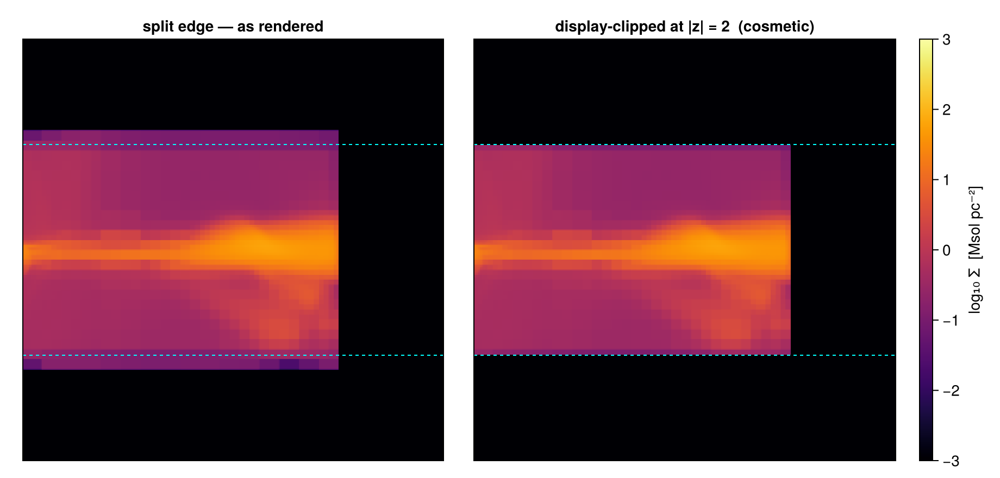

In [23]:
clipped = copy(pe_s0.maps[:sd])
zmask   = abs.(zs) .> 2.0
clipped[:, zmask] .= 0.0                                       # DISPLAY clip only
frac_clipped = sum(pe_s0.maps[:sd][:, zmask]) / sum(pe_s0.maps[:sd])
println("map mass removed by the display clip : ",
        round(100*frac_clipped, sigdigits=2), " %  (cosmetic only — msum is untouched)")


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(920, 440))
ax1 = Axis(fig[1, 1], title="split edge — as rendered")
show_sd!(ax1, pe_s0, (6, 14, -4, 4))
ax2 = Axis(fig[1, 2], title="display-clipped at |z| = 2  (cosmetic)")
xs2 = range(pe_s0.cextent[1]*kpc, pe_s0.cextent[2]*kpc; length=size(clipped, 1))
heatmap!(ax2, xs2, zs, log10.(max.(clipped, 1e-3)); colormap=:inferno, colorrange=SDLIM)
ax2.aspect = DataAspect(); ax2.backgroundcolor = :black; hidedecorations!(ax2)
limits!(ax2, 6, 14, -4, 4)
for ax in (ax1, ax2), zpl in (-2., 2.)
    lines!(ax, [6., 14.], [zpl, zpl]; color=:cyan, linewidth=1, linestyle=:dash)
end
sd_bar!(fig[1, 3])
fig

## 8. Tilted Regions

Real structures rarely align with the grid. The value-type `Cylinder` (and
`CylindricalShell`) accept any 3-vector as `axis` — only the value types can
do this; the classic `:cylinder` symbol form is strictly z-aligned. Projected
images compress the third dimension, so before extracting anything tilted, it
pays to draw the geometry once:

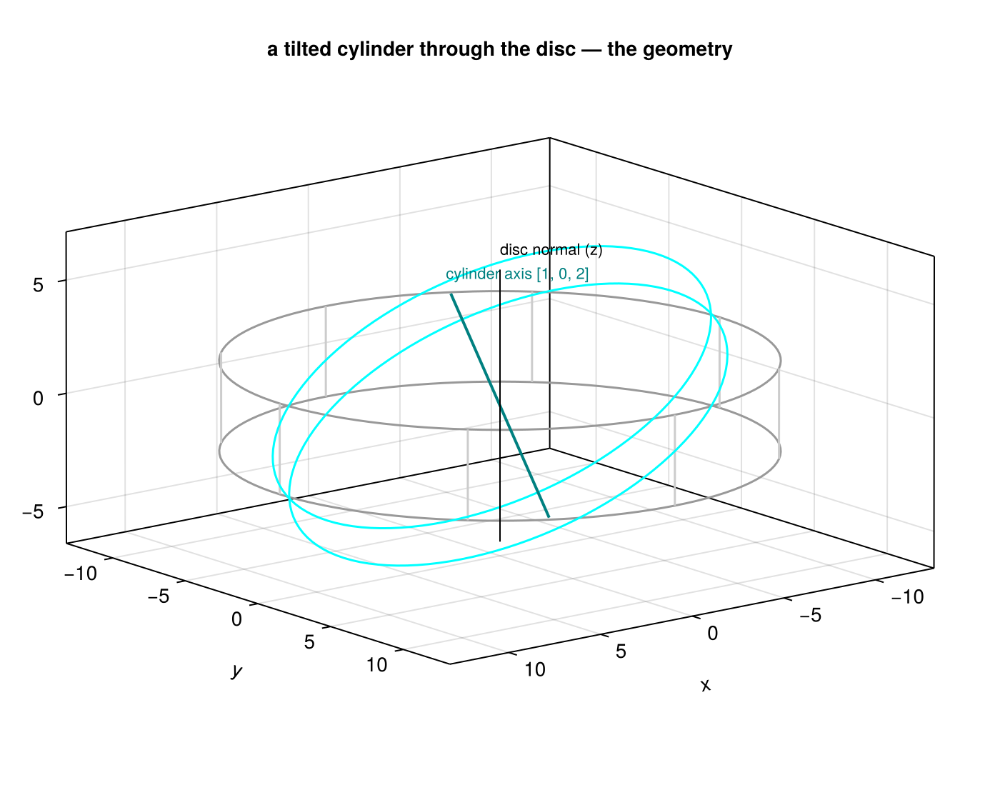

In [24]:
using LinearAlgebra

a  = normalize([1., 0., 2.])             # cylinder axis, tipped toward +x
e1 = normalize(cross([0., 0., 1.], a))   # ⊥ a
e2 = normalize(cross(a, e1))             # completes the orthonormal basis
θ3 = range(0, 2π; length=121)


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(700, 560))
ax  = Axis3(fig[1, 1]; aspect=:data, azimuth=0.9, elevation=0.25,
            title="a tilted cylinder through the disc — the geometry")
for zpl in (-2., 2.)                     # the ±2 kpc disc slab: top and bottom faces
    lines!(ax, 12 .* cos.(θ3), 12 .* sin.(θ3), fill(zpl, 121); color=:gray60)
end
for φ in range(0, 2π; length=9)[1:8]     # vertical strokes joining the faces
    lines!(ax, fill(12cos(φ), 2), fill(12sin(φ), 2), [-2., 2.]; color=:gray80)
end
for s in (-1., 1.)                       # the tilted cylinder: rims at ±1 kpc along its axis
    rim = [s .* a .+ 10. .* (cos(t) .* e1 .+ sin(t) .* e2) for t in θ3]
    lines!(ax, getindex.(rim, 1), getindex.(rim, 2), getindex.(rim, 3);
           color=:cyan, linewidth=1.5)
end
lines!(ax, [-6a[1], 6a[1]], [-6a[2], 6a[2]], [-6a[3], 6a[3]]; color=:teal, linewidth=2)
text!(ax, Point3f(6.6a[1], 0, 6.6a[3]); text="cylinder axis [1, 0, 2]", color=:teal, fontsize=11)
lines!(ax, [0., 0.], [0., 0.], [-6., 6.]; color=:black, linewidth=1)
text!(ax, Point3f(0, 0, 6.5); text="disc normal (z)", color=:black, fontsize=11)
fig

Now the extraction: `Cylinder(10., 1.; axis=[1., 0., 2.])`, a thin disc-like
slab tilted toward +x. Two checks that the tilt costs nothing: the volume
against the analytic πR²·2h (orientation does not enter the truth), and two
complementary views — along z the tilt reads only as a softened ellipse, along
y it reads as what it is, an inclined bar. To *view along* the tilted axis
rather than merely select along it, see the off-axis projection tutorials
([Projections: Off-Axis](06_offaxis_Projection.md),
[Off-axis Projection](06_offaxis_Projection.md)).

tilted-cylinder gas mass : 5.43585e9

 Msol
volume                   : 628.848 kpc³   vs  πR²·2h = 628.319 kpc³   (0.084 %)


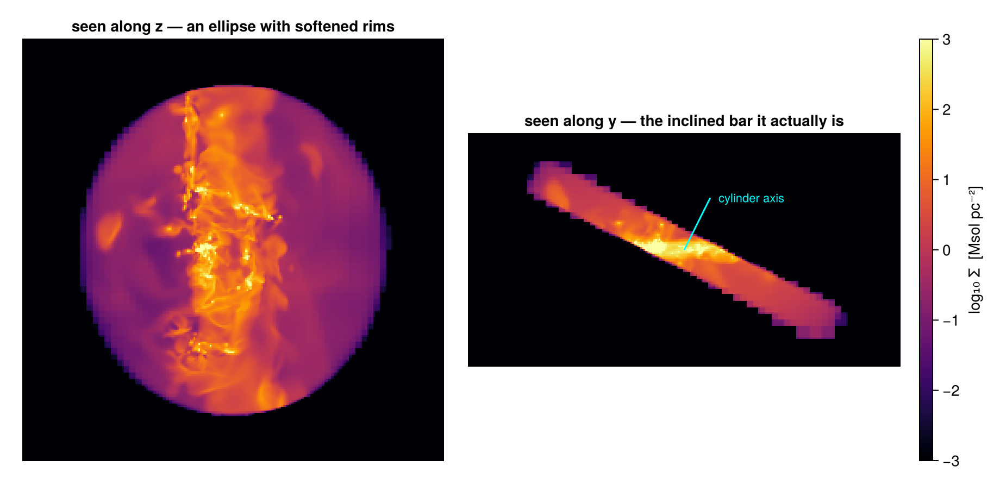

In [25]:
tilt_region = Cylinder(10., 1.; axis=[1., 0., 2.], center=[:bc], range_unit=:kpc)
tilted = subregion(gas, tilt_region, verbose=false)

v_tilt = sum(getvar(tilted, :volume, :kpc3))
v_ana  = π * 10.0^2 * 2.0
println("tilted-cylinder gas mass : ", round(msum(tilted, :Msol), sigdigits=6), " Msol")
println("volume                   : ", round(v_tilt, sigdigits=6), " kpc³   vs  πR²·2h = ",
        round(v_ana, sigdigits=6), " kpc³   (", round(100*(v_tilt/v_ana - 1), sigdigits=2), " %)")

pt1 = proj(tilted; xrange=[-13, 13], yrange=[-13, 13], pxsize=[0.1, :kpc])
pt2 = proj(tilted; direction=:y, xrange=[-13, 13], zrange=[-7, 7], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(920, 440))
ax1 = Axis(fig[1, 1], title="seen along z — an ellipse with softened rims")
show_sd!(ax1, pt1, (-13, 13, -13, 13))
ax2 = Axis(fig[1, 2], title="seen along y — the inclined bar it actually is")
show_sd!(ax2, pt2, (-13, 13, -7, 7))
lines!(ax2, [0., 3.5a[1]], [0., 3.5a[3]]; color=:cyan, linewidth=1.5)
text!(ax2, 3.5a[1] + 0.5, 3.5a[3]; text="cylinder axis", color=:cyan, fontsize=11,
      align=(:left, :center))
sd_bar!(fig[1, 3])
fig

The volume lands on the analytic value to the usual sampling accuracy —
tilting a region moves no goalposts. And the two views are the depth lesson of
§5 one more time: the same selection can look like a blur or like a bar,
depending on which axis you compress.

Shells tilt too — `CylindricalShell` takes the same `axis` — and for a tilted
selection the natural view is *along its own axis*, which the off-axis
projection provides directly (`los=` takes the same vector). Three views of
one tilted ring: face-on it is an elliptical annulus, along its own axis it
becomes the circular ring it really is, and edge-on (along y) it shows its
inclination. As a second orientation check, an **in-plane bar** — a thin
cylinder whose axis lies *in* the disc plane — plus the volume-invariance
numbers for both:

tilted shell volume : 402.739

 kpc³   upright: 403.265 kpc³   analytic π(R²−r²)·2h = 402.124 kpc³
in-plane bar volume : 120.595

 kpc³   analytic πR²·2h = 120.637 kpc³


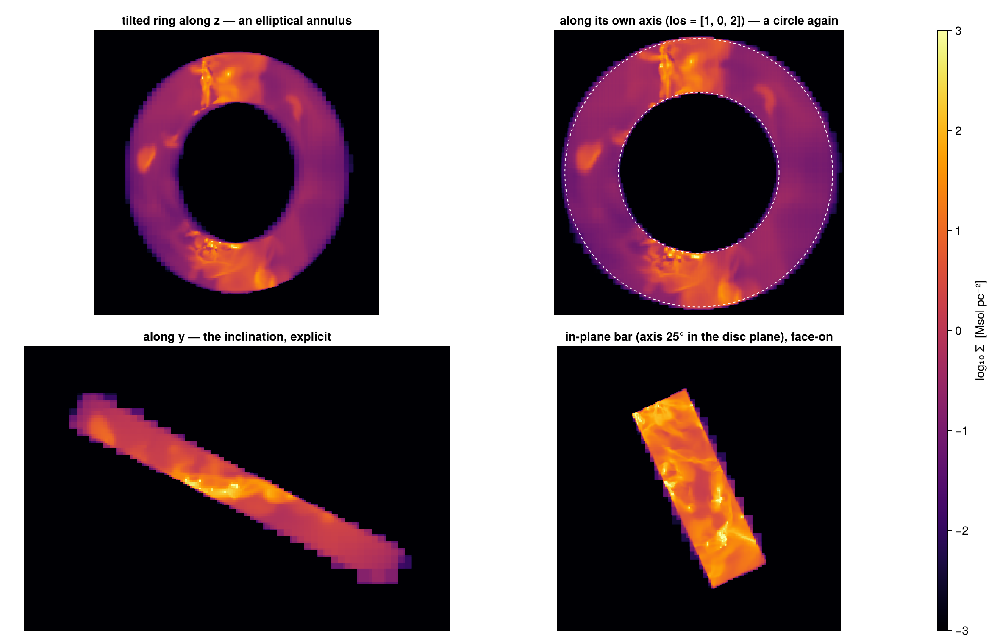

In [26]:
tshell_region = CylindricalShell(6., 10., 1.; axis=[1., 0., 2.], center=[:bc], range_unit=:kpc)
tshell = subregion(gas, tshell_region, verbose=false)
v_ts   = sum(getvar(tshell, :volume, :kpc3))
v_up   = sum(getvar(subregion(gas, CylindricalShell(6., 10., 1.; center=[:bc], range_unit=:kpc),
                              verbose=false), :volume, :kpc3))
println("tilted shell volume : ", round(v_ts, sigdigits=6), " kpc³   upright: ",
        round(v_up, sigdigits=6), " kpc³   analytic π(R²−r²)·2h = ",
        round(π*(100-36)*2, sigdigits=6), " kpc³")

bar_region = Cylinder(4., 1.2; axis=[cosd(25.), sind(25.), 0.], center=[:bc], range_unit=:kpc)
bar = subregion(gas, bar_region, verbose=false)
println("in-plane bar volume : ", round(sum(getvar(bar, :volume, :kpc3)), sigdigits=6),
        " kpc³   analytic πR²·2h = ", round(π*16*2.4, sigdigits=6), " kpc³")

pt_f = proj(tshell; xrange=[-12, 12], yrange=[-12, 12], pxsize=[0.1, :kpc])
pt_a = projection(tshell, :sd, :Msol_pc2; los=[1., 0., 2.], center=[:bc], range_unit=:kpc,
                  pxsize=[0.1, :kpc], verbose=false, show_progress=false)
pt_e = proj(tshell; direction=:y, xrange=[-12, 12], zrange=[-8, 8], pxsize=[0.1, :kpc])
pb   = proj(bar; xrange=[-6, 6], yrange=[-6, 6], pxsize=[0.05, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(1180, 760))
ax1 = Axis(fig[1, 1], title="tilted ring along z — an elliptical annulus")
show_sd!(ax1, pt_f, (-12, 12, -12, 12))
ax2 = Axis(fig[1, 2], title="along its own axis (los = [1, 0, 2]) — a circle again")
show_sd!(ax2, pt_a)
for r in (6., 10.)
    arc!(ax2, Point2f(0, 0), r, 0, 2π; color=:white, linewidth=1, linestyle=:dash)
end
ax3 = Axis(fig[2, 1], title="along y — the inclination, explicit")
show_sd!(ax3, pt_e, (-12, 12, -8, 8))
ax4 = Axis(fig[2, 2], title="in-plane bar (axis 25° in the disc plane), face-on")
show_sd!(ax4, pb, (-6, 6, -6, 6))
sd_bar!(fig[:, 3])
fig

The along-axis panel is the payoff: the dashed analytic circles at 6 and
10 kpc land on the rendered rims, because selecting along a vector and viewing
along the same vector are consistent operations. Both tilted volumes agree
with their upright twins and with the analytic values — orientation costs
nothing.

## 9. Composite Regions with a Purpose

Everything so far combined at most three shapes. Nothing stops a composition
from being a small *model* — each construct below answers a question a plain
shape cannot, and every one is a single region expression whose boundary cells
are still fraction-weighted. First, a capstone with its books checked: the
disc, unioned with a "blister" sphere sitting on its upper face, minus a
chimney drilled vertically through — and the inclusion–exclusion identity that
proves the algebra kept count:

(disc ∪ blister) \ chimney : 2.27205e10

 Msol
identity  m(A∪B) − m((A∪B)∩C) = 2.2720464e10   vs  2.2720464e10


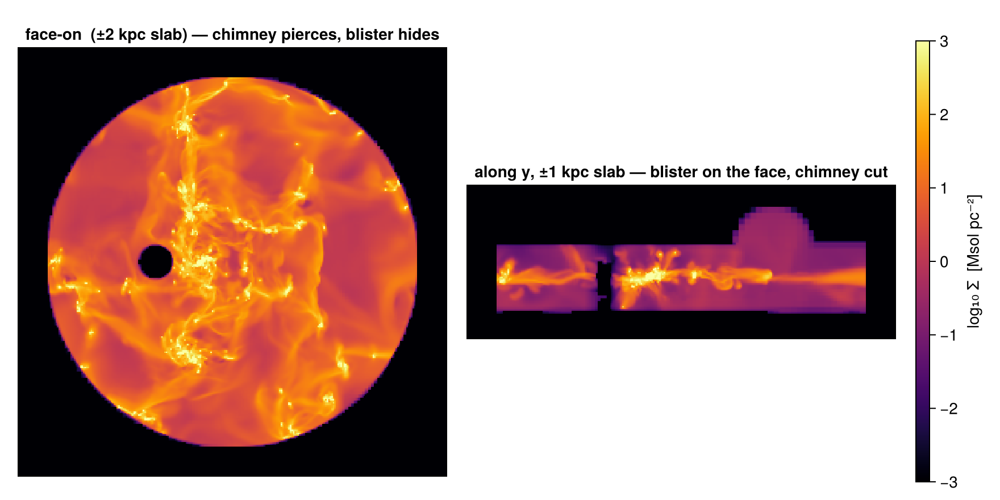

In [27]:
blister = Sphere(2.5; center=[30., :bc, 26.], range_unit=:kpc)   # resting on the +z face
chimney = Cylinder(1.2, 5.; center=[19., :bc, :bc], range_unit=:kpc)

capstone = (disc_region ∪ blister) \ chimney
cap = subregion(gas, capstone, verbose=false)

mAB  = msum(subregion(gas, disc_region ∪ blister, verbose=false), :Msol)
mC   = msum(subregion(gas, (disc_region ∪ blister) ∩ chimney, verbose=false), :Msol)
println("(disc ∪ blister) \\ chimney : ", round(msum(cap, :Msol), sigdigits=6), " Msol")
println("identity  m(A∪B) − m((A∪B)∩C) = ", round(mAB - mC, sigdigits=8),
        "   vs  ", round(msum(cap, :Msol), sigdigits=8))

pcf = proj(cap; xrange=[-14, 14], yrange=[-14, 14], zrange=[-2, 2], pxsize=[0.1, :kpc])
pce = proj(cap; direction=:y, yrange=[-1, 1], xrange=[-14, 14], zrange=[-4, 6], pxsize=[0.1, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(880, 440))
ax1 = Axis(fig[1, 1], title="face-on  (±2 kpc slab) — chimney pierces, blister hides")
show_sd!(ax1, pcf, (-14, 14, -14, 14))
ax2 = Axis(fig[1, 2], title="along y, ±1 kpc slab — blister on the face, chimney cut")
show_sd!(ax2, pce, (-14, 14, -4, 6))
sd_bar!(fig[1, 3])
fig

The identity closes, and the edge-on view explains the face-on one: the
blister only *adds* gas above the +z face (invisible face-on, where the disc
outshines it), while the chimney removes a full column (black face-on). Now
three constructs with astrophysical names — **chimneys** (a disc minus
vertical flow channels), a **crescent** (two offset spheres, the classic
shock-front / bow shape), both shown in the views that make them legible:

chimneys: 2.2548e10

 Msol   crescent: 2.1784e9 Msol


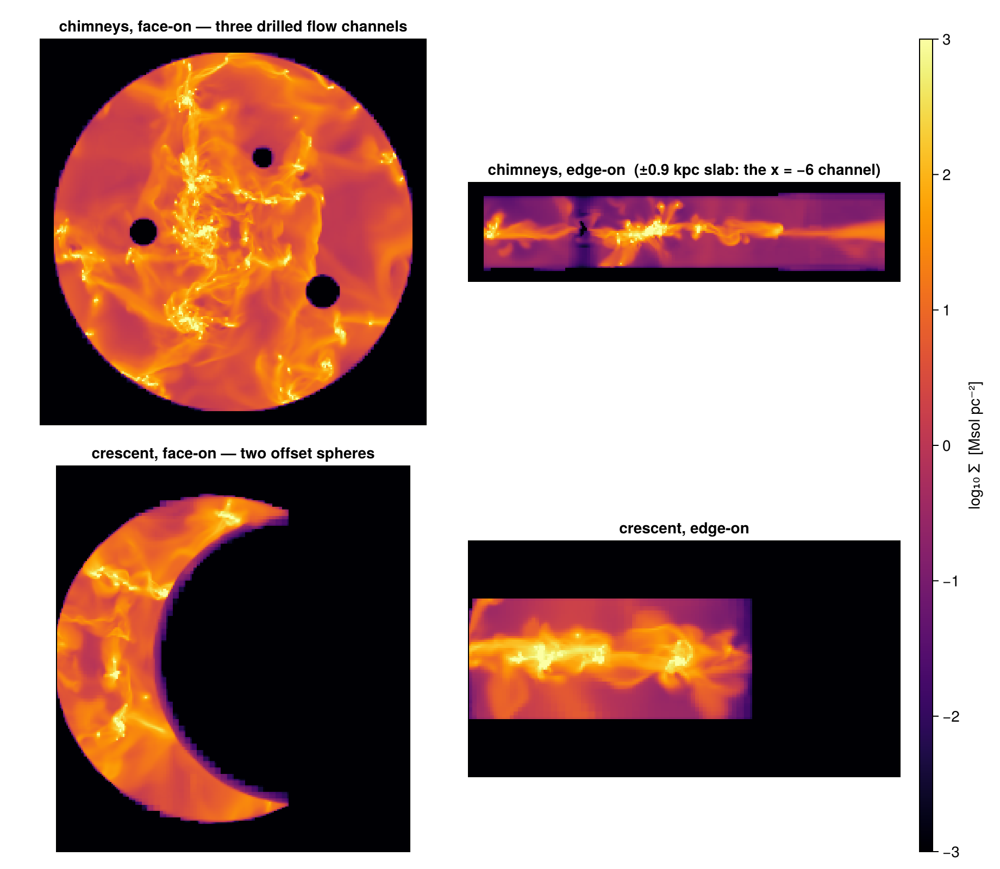

In [28]:
chimneys_region = disc_region \ (Cylinder(1.0, 5.; center=[18., :bc, :bc], range_unit=:kpc) ∪
                                 Cylinder(0.8, 5.; center=[26., 29., :bc], range_unit=:kpc) ∪
                                 Cylinder(1.2, 5.; center=[30., 20., :bc], range_unit=:kpc))
chim = subregion(gas, chimneys_region, verbose=false)

crescent_region = (Sphere(5.; center=[28., :bc, :bc], range_unit=:kpc) \
                   Sphere(4.5; center=[30.5, :bc, :bc], range_unit=:kpc)) ∩
                  Cuboid(xrange=[-12, 12], yrange=[-12, 12], zrange=[-1.5, 1.5],
                         center=[:bc], range_unit=:kpc)
cres = subregion(gas, crescent_region, verbose=false)
println("chimneys: ", round(msum(chim, :Msol), sigdigits=5), " Msol   crescent: ",
        round(msum(cres, :Msol), sigdigits=5), " Msol")

pch_f = proj(chim; xrange=[-13, 13], yrange=[-13, 13], pxsize=[0.1, :kpc])
pch_e = proj(chim; direction=:y, yrange=[-0.9, 0.9], xrange=[-13, 13], zrange=[-3, 3], pxsize=[0.1, :kpc])
pcr_f = proj(cres; xrange=[-1, 10], yrange=[-6, 6], pxsize=[0.05, :kpc])
pcr_e = proj(cres; direction=:y, xrange=[-1, 10], zrange=[-3, 3], pxsize=[0.05, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(920, 800))
ax1 = Axis(fig[1, 1], title="chimneys, face-on — three drilled flow channels")
show_sd!(ax1, pch_f, (-13, 13, -13, 13))
ax2 = Axis(fig[1, 2], title="chimneys, edge-on  (±0.9 kpc slab: the x = −6 channel)")
show_sd!(ax2, pch_e, (-13, 13, -3, 3))
ax3 = Axis(fig[2, 1], title="crescent, face-on — two offset spheres")
show_sd!(ax3, pcr_f, (-1, 10, -6, 6))
ax4 = Axis(fig[2, 2], title="crescent, edge-on")
show_sd!(ax4, pcr_e, (-1, 10, -3, 3))
sd_bar!(fig[:, 3])
fig

**Swiss cheese, seeded by the data.** Composites become genuinely powerful
when the geometry comes from the *data* — here we carve a hole around each of
the galaxy's three densest star-cluster sites (found from the star particles,
next chapter's protagonists), the shape of a feedback-cleared ISM:

star particles: 508939


cluster sites [kpc, centre-relative]: 

[(-3.2, 8.8), (-3.2, -5.8), (-2.2, 3.8)]
swiss-cheese disc: 

1.5925e10 Msol


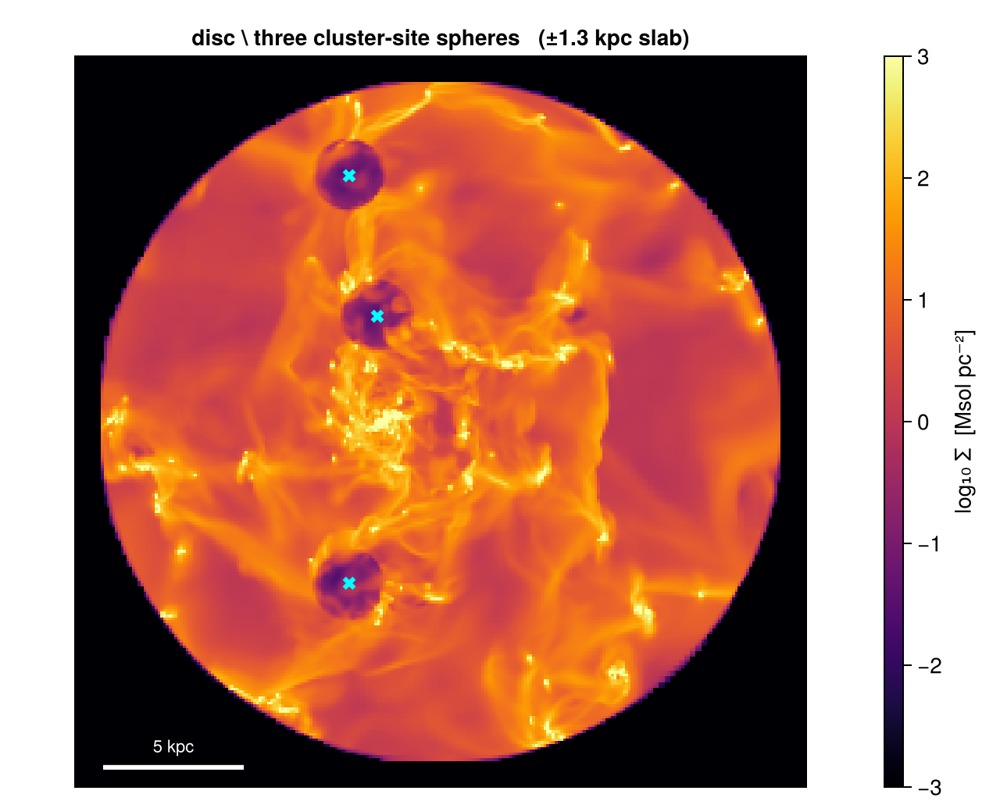

In [29]:
part = getparticles(info, verbose=false, show_progress=false)
pcols = propertynames(Mera.columns(part.data))
:birth in pcols && (part = Mera.construct_datatype(filter(p -> p.birth > 0., part.data), part))
println("star particles: ", length(part.data))

pxs = getvar(part, :x, :kpc) .- 24.; pys = getvar(part, :y, :kpc) .- 24.
pzs = getvar(part, :z, :kpc) .- 24.; pms = getvar(part, :mass, :Msol)

# densest star sites: 0.5-kpc 2-D mass grid in the 4 < r < 10 kpc disc annulus,
# greedy top-3 with ≥ 3 kpc separation
sel  = (16. .< pxs.^2 .+ pys.^2 .< 100.) .& (abs.(pzs) .< 2.)
bins = Dict{Tuple{Int,Int},Float64}()
for (x, y, m) in zip(pxs[sel], pys[sel], pms[sel])
    k = (floor(Int, x/0.5), floor(Int, y/0.5)); bins[k] = get(bins, k, 0.0) + m
end
sites = Tuple{Float64,Float64}[]
for (k, m) in sort(collect(bins); by=last, rev=true)
    c = (0.5k[1] + 0.25, 0.5k[2] + 0.25)
    all(hypot(c[1]-s[1], c[2]-s[2]) >= 3. for s in sites) && push!(sites, c)
    length(sites) == 3 && break
end
println("cluster sites [kpc, centre-relative]: ", [round.(s, digits=1) for s in sites])

holes  = reduce(∪, [Sphere(1.3; center=[24. + s[1], 24. + s[2], :bc], range_unit=:kpc)
                    for s in sites])
cheese = subregion(gas, disc_region \ holes, verbose=false)
println("swiss-cheese disc: ", round(msum(cheese, :Msol), sigdigits=5), " Msol")

pw = proj(cheese; xrange=[-13, 13], yrange=[-13, 13], zrange=[-1.3, 1.3], pxsize=[0.1, :kpc])

# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(640, 520))
ax = Axis(fig[1, 1], title="disc \\ three cluster-site spheres   (±1.3 kpc slab)")
show_sd!(ax, pw, (-13, 13, -13, 13))
for s in sites
    scatter!(ax, [s[1]], [s[2]]; marker=:xcross, color=:cyan, markersize=12)
end
scalebar!(ax, -12, -12.3, 5)
sd_bar!(fig[1, 2])
fig

The crosses mark the sites the *particles* chose; the holes are where the
*gas* was carved — and the ledger delivers the punchline: the three spheres
hold ≈3 % of the disc's volume but ~30 % of its mass, because star clusters
sit exactly on the densest gas. Two more shapes close the gallery — a **plate carved into
bows** by four corner spheres (pure geometry), and a **filament tube**: three
tilted cylinders stitched along a polyline, the shape you would use to follow
an accretion stream or a spiral-arm segment:

bows: 1.0791e10

 Msol   filament tube: 2.3211e9 Msol


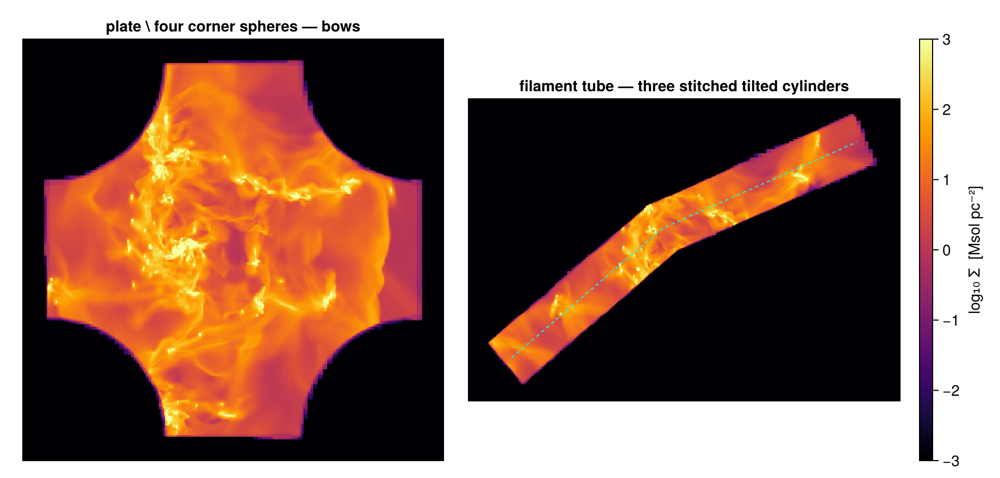

In [30]:
plate = Cuboid(xrange=[-7, 7], yrange=[-7, 7], zrange=[-1, 1], center=[:bc], range_unit=:kpc)
bows_region = plate \ (Sphere(4.5; center=[17., 17., :bc], range_unit=:kpc) ∪
                       Sphere(4.5; center=[31., 17., :bc], range_unit=:kpc) ∪
                       Sphere(4.5; center=[17., 31., :bc], range_unit=:kpc) ∪
                       Sphere(4.5; center=[31., 31., :bc], range_unit=:kpc))
bows = subregion(gas, bows_region, verbose=false)

waypoints = [(-9., -4.), (-2., 2.), (7., 6.)]
segs = AbstractRegion[]
for k in 1:length(waypoints)-1
    a = [waypoints[k]..., 0.]; b = [waypoints[k+1]..., 0.]
    d = b .- a; mid = (a .+ b) ./ 2 .+ 24.
    push!(segs, Cylinder(1.2, sqrt(sum(abs2, d))/2 + 0.3; axis=d, center=mid, range_unit=:kpc))
end
fil = subregion(gas, reduce(∪, segs), verbose=false)
println("bows: ", round(msum(bows, :Msol), sigdigits=5), " Msol   filament tube: ",
        round(msum(fil, :Msol), sigdigits=5), " Msol")

pbw = proj(bows; xrange=[-8, 8], yrange=[-8, 8], pxsize=[0.05, :kpc])
pfl = proj(fil;  xrange=[-11, 9], yrange=[-6, 8], pxsize=[0.05, :kpc])


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(920, 440))
ax1 = Axis(fig[1, 1], title="plate \\ four corner spheres — bows")
show_sd!(ax1, pbw, (-8, 8, -8, 8))
ax2 = Axis(fig[1, 2], title="filament tube — three stitched tilted cylinders")
show_sd!(ax2, pfl, (-11, 9, -6, 8))
lines!(ax2, [w[1] for w in waypoints], [w[2] for w in waypoints];
       color=:cyan, linewidth=1, linestyle=:dash)
sd_bar!(fig[1, 3])
fig

Every construct here remains a *measurement*: `msum` on any of them is
fraction-exact, additive against its complement, and reusable — which the next
chapter exploits by pointing the very same region objects at a different kind
of data.

## 10. The Budget, with Stars

The region objects know nothing about cell data — applied to a particle
dataset, `subregion` performs exact point-membership on the same geometry. So
the §6 ledger extends to the *stellar* content of this star-forming galaxy
with no new geometry at all: one region value cuts both datatypes.

disc zone       gas [Msol]   stars [Msol]
-----------------------------------------
nucleus            5.937e9

        1.873e9
inner               3.95e9        1.153e9
ring               8.032e9        1.661e9
rim                4.915e9

        4.586e8
-----------------------------------------
sum             2.28346e10      5.14581e9
disc direct     2.28346e10      5.14581e9


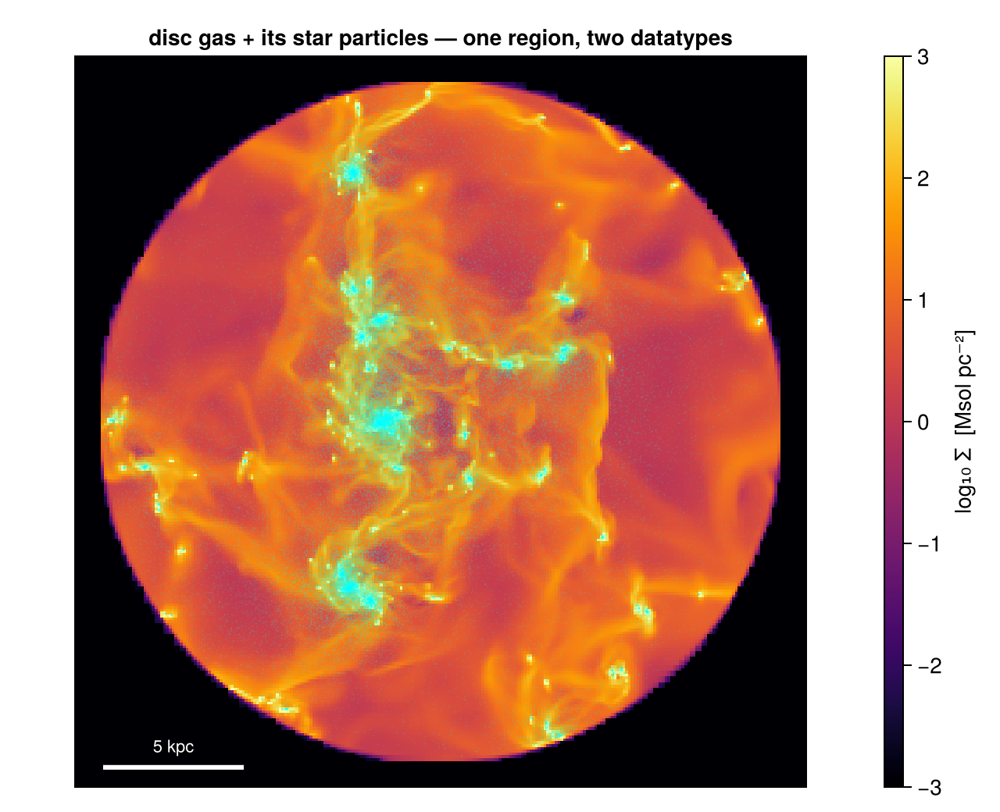

In [31]:
zones_all = [("nucleus", nucleus_region, m_nuc),
             ("inner",   inner_zone,     m_inner),
             ("ring",    ring_region,    m_ring),
             ("rim",     rim_zone,       m_rim)]

println(rpad("disc zone", 12), lpad("gas [Msol]", 14), lpad("stars [Msol]", 15))
println("-"^41)
ms_zones = Float64[]
for (name, reg, mgas) in zones_all
    ms = msum(subregion(part, reg, verbose=false), :Msol)
    push!(ms_zones, ms)
    println(rpad(name, 12), lpad(string(round(mgas, sigdigits=4)), 14),
            lpad(string(round(ms, sigdigits=4)), 15))
end
ms_disc = msum(subregion(part, disc_region, verbose=false), :Msol)
println("-"^41)
println(rpad("sum", 12), lpad(string(round(m_disc, sigdigits=6)), 14),
        lpad(string(round(sum(ms_zones), sigdigits=6)), 15))
println(rpad("disc direct", 12), lpad(string(round(m_disc, sigdigits=6)), 14),
        lpad(string(round(ms_disc, sigdigits=6)), 15))

p_gasd = proj(disc; xrange=[-13, 13], yrange=[-13, 13], pxsize=[0.1, :kpc])
stars_d = subregion(part, disc_region, verbose=false)
sx = getvar(stars_d, :x, :kpc) .- 24.; sy = getvar(stars_d, :y, :kpc) .- 24.


# ── figure code from here: panels, overlays, colorbars — no new Mera concepts ──
fig = Figure(size=(640, 520))
ax = Axis(fig[1, 1], title="disc gas + its star particles — one region, two datatypes")
show_sd!(ax, p_gasd, (-13, 13, -13, 13))
scatter!(ax, sx[1:4:end], sy[1:4:end]; color=(:cyan, 0.15), markersize=1.2)   # every 4th star
scalebar!(ax, -12, -12.3, 5)
sd_bar!(fig[1, 2])
fig

The stellar column tiles exactly like the gas column — particles are
points, so zone membership is unambiguous and the four zones sum to the disc
by construction. The overlay shows why the ledger looks the way it does: the
stars trace the dense gas that formed them, concentrated in the nucleus and
along the ring's clumps.

## 11. Working at Scale: Cut Once, Save, Reload

This page's snapshot loads in seconds, but the workflow transfers to
snapshots that do not. Two levers, applied in order. **Columns first**: this
whole notebook ran on `gethydro(info, :rho, …)` — the four AMR coordinates
plus one field are all a mass budget needs, and on a multi-gigabyte snapshot
that read-time column cut is the difference between fitting in RAM or not.
**Then the window**: cut the region you will actually study *once*, save it
with `savedata`, and do every subsequent analysis session from the compact
file — `loaddata` reads a whole datatype before any spatial filtering, so
windowing must happen before the save, not after the load:

In [32]:
win = subregion(gas, :cuboid; xrange=[-13, 13], yrange=[-13, 13], zrange=[-3, 3],
                center=[:bc], range_unit=:kpc, verbose=false)

tmpdir = mktempdir()
savedata(win, tmpdir; fmode=:write, verbose=false)
back = loaddata(400, tmpdir, :hydro, verbose=false)

fsz = sum(filesize, readdir(tmpdir; join=true)) / 1024^2
println("working file  : ", round(fsz, digits=1), " MB   (", length(back.data), " cells)")
println("mass, window  : ", round(msum(win,  :Msol), sigdigits=8), " Msol")
println("mass, reloaded: ", round(msum(back, :Msol), sigdigits=8), " Msol")

working file  : 147.5 MB   (17957496 cells)
mass, window  : 2.7966433e10

 Msol
mass, reloaded: 2.7966433e10

 Msol


The round-trip is lossless, and every technique on this page — regions,
algebra, budgets, `refine` — works on the reloaded object unchanged. On truly
large data, release each section's working object when done
(`obj = nothing; GC.gc()`) and keep exactly one in memory at a time.

## 12. Reference: the Classic Symbol API

Everything above has a whole-cell counterpart in the original symbol-based
interface, which remains fully supported. It is the right tool for quick
exploratory cuts where a jagged rim is irrelevant, and it keeps older analysis
scripts working unchanged.

| Value type | Classic call |
|:--|:--|
| `Cuboid(xrange=…, yrange=…, zrange=…)` | `subregion(gas, :cuboid; xrange=…, yrange=…, zrange=…)` |
| `Sphere(R)` | `subregion(gas, :sphere; radius=R)` |
| `Cylinder(R, H)` | `subregion(gas, :cylinder; radius=R, height=H)` (z-axis only) |
| `SphericalShell(rin, rout)` | `shellregion(gas, :sphere; radius=[rin, rout])` |
| `CylindricalShell(rin, rout, H)` | `shellregion(gas, :cylinder; radius=[rin, rout], height=H)` |

Shared keywords: `center`, `range_unit`, `inverse=true` for the complement,
and `cell=true/false` for the whole-cell or centre-inside test — the same two
alternatives §3 derived from the split extraction, in symbol form. The
comparison below duly lands *above* the split disc mass. One guard to know:
radii and heights must be nonzero — a zero-sized region is an error. The
`center` is never refused, but it defaults to the box **corner**, so omitting
it on a sphere or cylinder places the region there and keeps only the octant
inside the box; Mera notes that once per shape. A *single* zero component is
perfectly good (a sphere on the `x = 0` face is a legitimate region). The hydro
cylinder additionally offers `smooth_boundary=true`, an intermediate edge
softening predating fraction splitting. `get_filtered_ranges` recovers the
bounding ranges of any cut, ready to pass to `projection`.

In [33]:
cub_c = subregion(gas, :cuboid; xrange=[-12, 12], yrange=[-12, 12], zrange=[-2, 2],
                  center=[:bc], range_unit=:kpc, verbose=false)
sph_c = subregion(gas, :sphere; radius=10., center=[13., :bc, :bc], range_unit=:kpc,
                  cell=false, verbose=false)
cyl_c = subregion(gas, :cylinder; radius=12., height=2., center=[:bc], range_unit=:kpc,
                  verbose=false)
shl_c = shellregion(gas, :sphere; radius=[10., 20.], center=[:bc], range_unit=:kpc,
                    verbose=false)

m_cylc = msum(cyl_c, :Msol)
println("classic cylinder (whole cells) : ", round(m_cylc, sigdigits=6), " Msol   +",
        round(100*(m_cylc/m_disc - 1), sigdigits=2),
        " % vs split disc — whole boundary cells, as in §3")

xr_c, yr_c, zr_c = Mera.get_filtered_ranges(cyl_c)   # normalised [0,1] box fractions of the cut
println("cut spans x ∈ ", round.(xr_c .* (gas.boxlen * kpc), sigdigits=4), " kpc (absolute)")

classic cylinder (whole cells) : 2.29023e10

 Msol   +0.3 % vs split disc — whole boundary cells, as in §3
cut spans x ∈ 

[12.0, 36.0] kpc (absolute)


## 13. Practical Guidance

**Which mode when.**

- *Exploring?* Whole-cell cuts (`cell=true`) are the cheapest and guarantee you
  see **all** material near the region — a strict superset, and therefore a
  strict upper bound on any mass it encloses.
- *Want the fewest cells?* The centre test (`cell=false`, or `split=false` on a
  value-type region) keeps a subset of the whole-cell selection and usually
  lands close to the split value — but §4's ring showed its residual has no
  guaranteed sign. Treat it as an estimate, never as a bound.
- *Measuring* a mass, volume, or profile? Value-type regions with the default
  `split=true` — the `:fraction` column makes `msum`, `getvar(:mass)`,
  `getvar(:volume)`, and projections boundary-aware, and adjacent regions
  additive.
- *Publishing a figure of a cut?* Consider `refine=k` — or
  `refine_to=[pxsize…]` to match the boundary to your map's pixel grid (§7)
  — scoped to the area you render, not to the whole boundary.

**Cost.** Region selection is bounding-box pruned: cells that cannot touch
the region are skipped outright, so a small or composite cut costs roughly
its bounding volume, not the whole dataset. Splitting adds one fraction
evaluation per boundary cell; interior cells are untouched. Fractions of curved surfaces are sub-sampled (`nsub`,
default 8 per axis — §3 measured what that buys); raise it only when coarse
boundary cells meet a tight accuracy requirement. `refine=k` multiplies only
the boundary-cell rows (up to 8ᵏ children each) — cheap on a slab, expensive
on the full surface of a large region.

**Trust, but verify.** The two structural guarantees of this page — region +
inverse partitions the box, adjacent regions tile their union — are one-line
checks (`msum` sums). Fire them in real analyses too; they are the cheapest
insurance a mass budget can buy.

## Summary

- On an AMR grid, a region boundary is a *choice*: whole cells strictly
  over-count, centre tests scatter close to the truth with no guarantee, and
  fraction splitting measures. Quote the split value; the whole-cell excess
  tells you how much the boundary cells matter.
- Fractions of curved boundaries are sub-sampled (`nsub`): integrals are exact
  to that sampling, and §3 measured it against an analytic volume. Rendered
  edges feather at the local cell size, bounded by one cell + one pixel;
  `refine=k` localises them to cellsize/2ᵏ, and `refine_to=[length, unit]`
  matches the boundary to your map's pixel size (§7).
- Value-type regions (`Sphere`, `Cuboid`, `Cylinder`, `SphericalShell`,
  `CylindricalShell`) are applied with `subregion(gas, region)`, compose with
  `∩ ∪ \ !`, tilt via `axis`, invert with `inverse=true` — and adjacent split
  regions are additive, which is what let the §6 ledger balance to
  floating-point accuracy.
- The classic `subregion`/`shellregion` symbol API remains the quick
  whole-cell workhorse and the compatibility path for existing scripts.

**Continue with:**

- [Masking & Filtering](05_multi_Masking_Filtering.md) — select by *value*
  (density, temperature, any derived quantity) and combine with these
  geometric regions.
- The sibling sub-region tutorials for
  [particles](03_particles_Get_Subregions.md),
  [gravity](03_gravity_Get_Subregions.md), and
  [clumps](03_clumps_Get_Subregions.md).
- [Projections: Off-Axis](06_offaxis_Projection.md) — view along a tilted
  region's axis.